# Packages/Libraries to use

In [1]:
''' use base anaconda kernel '''

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import os
from PIL import Image

import time

from pathlib import Path

import cv2 as cv

import torch
import torchvision 

# Loading in Data 

In [2]:
# load in dataframe
df_cleaned = pd.read_csv('df_cleaned.csv')
df_cleaned.dropna(inplace=True)

# define labels 
labels = list(df_cleaned['category'].unique())

# load in list of test videos
test_vids = pd.read_csv('test_videos_small.csv', header=None)
test_vids.drop(columns=[0], inplace=True)
test_vids.rename(columns={1:'video_name'}, inplace=True)

# picking one entire video
vid = test_vids['video_name'][0]
# define path
path = 'frames_v2/'

/tmp/ipykernel_2029/3112281533.py:2: DtypeWarning: Columns (5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df_cleaned = pd.read_csv('df_cleaned.csv')


In [3]:
df_cleaned.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,x,y,w,h
0,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89537.0,car,False,True,False,836.812933,1014.734411,355.011547,418.198614,True,836.812933,355.011547,177.921478,63.187067
1,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89538.0,car,False,True,False,486.143187,705.727483,347.682421,422.725173,True,486.143187,347.682421,219.584296,75.042752
2,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89539.0,pedestrian,False,True,False,653.071594,670.531178,338.383372,357.505774,True,653.071594,338.383372,17.459584,19.122402
3,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89540.0,car,False,False,False,129.859655,198.354948,358.720910,406.558891,True,129.859655,358.720910,68.495292,47.837982
4,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89541.0,car,False,False,False,260.739030,324.526559,353.487298,400.046189,True,260.739030,353.487298,63.787529,46.558891


In [4]:
test_vids.head()

,video_name
0,002d290d-89f4e5c0
1,0035afff-bd191d6a
2,0062f18d-f8cd3a65
3,007aeb45-3e75ce0e
4,00825605-9dcec7d0


In [5]:
print(labels)
print(path)
print(vid)

['car', 'pedestrian', 'truck', 'motorcycle', 'rider', 'bicycle', 'bus', 'other vehicle', 'other person', 'train', 'trailer']
frames_v2/
002d290d-89f4e5c0


# Connect to AWS GPU

In [6]:
'''
CONNECT TO GPU OF AWS
'''

# Check if CUDA (GPU support) is available
if torch.cuda.is_available():
    print("GPU available.... connecting now")
    print(torch.cuda.get_device_name(0))  # Print GPU name
else:
    print("GPU not available")

# Check if GPU is available and set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



GPU available.... connecting now
NVIDIA A10G


# Set up YOLO Model

In [7]:
# helper for easier paths to datasets
HOME = os.getcwd()
print(HOME)

/home/ubuntu/project/ese546finalproject


In [8]:
# # Pip install method (recommended)

# !pip install git+https://github.com/ultralytics/ultralytics.git@main

# !pip install ultralytics

!pip install -r requirements.txt

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.227 🚀 Python-3.11.5 torch-2.1.2 CUDA:0 (NVIDIA A10G, 22564MiB)
Setup complete ✅ (4 CPUs, 15.4 GB RAM, 114.8/248.1 GB disk)


In [9]:
from ultralytics import YOLO

from IPython.display import display, Image

In [10]:
model = YOLO(f'{HOME}/yolov8n.pt')


## Testing Single Images

### 2 different methods:

- (1) CLI
    - task --> detect, classify, or segment 
    - mode --> train, val, predict, or export
    - model --> weights to use (yolov8n.pt)
    - conf --> confidence (0.25)
    - source --> image to use

- (2) SDK 



## CLI

* CLI is for trainnig, testing, and predicting in terminal

* testing it on external image:

In [ ]:
# %cd {HOME}
# !yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=True

In [ ]:
# %cd {HOME}
# !yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='frames_v2/01c71072-718028b8-0000002.jpg' save=True

In [ ]:
# %cd {HOME}
# Image(filename=f'{HOME}01c71072-718028b8-0000002.jpg', width=600)

* trying it with our data

In [ ]:
# %cd {HOME}
# !yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source=video save=True

In [ ]:
# %cd {HOME}
# Image(filename=video, height=600)

## SDK

* attempt on our own image

In [11]:
results = model.predict(
   source='frames_v2/01c71072-718028b8-0000002.jpg',
   conf=0.25
)


image 1/1 /home/ubuntu/project/ese546finalproject/frames_v2/01c71072-718028b8-0000002.jpg: 384x640 3 cars, 114.1ms
Speed: 10.3ms preprocess, 114.1ms inference, 35.9ms postprocess per image at shape (1, 3, 384, 640)


In [12]:
# bounding boxes for the objects detected - x1y1, x2y2
results[0].boxes.xyxy

tensor([[  7.5780, 369.1844,  94.9579, 421.8085],
        [452.8893, 356.5795, 595.4589, 431.6505],
        [116.7452, 363.6737, 197.2686, 412.7683]], device='cuda:0')

In [13]:
# confidence values of the boxes
results[0].boxes.conf

tensor([0.6936, 0.4158, 0.3331], device='cuda:0')

In [14]:
# class values of the boxes
results[0].boxes.cls

tensor([2., 2., 2.], device='cuda:0')

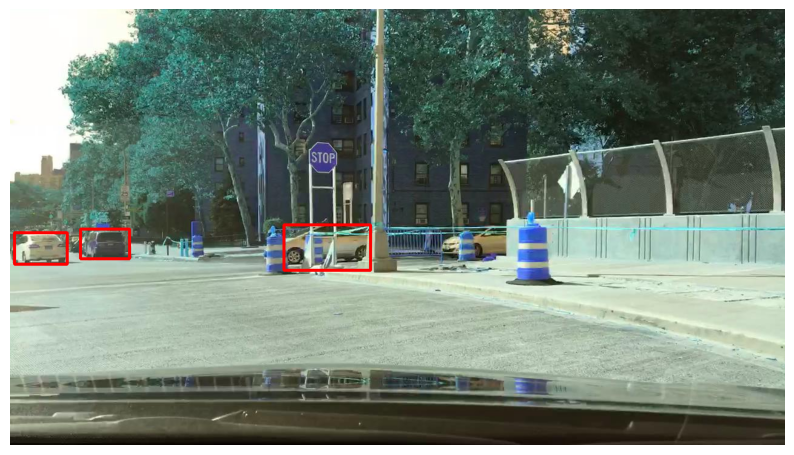

In [15]:
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")
    plt.show()

color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 100, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

img = cv.imread('frames_v2/01c71072-718028b8-0000002.jpg')
img = np.array(img)


img_example = img.copy()
# frame_labels = df_cleaned[df_cleaned['name'] == img_example]
for i, d in enumerate(results[0].boxes.xyxy):
    pt1 = int(d[0]), int(d[1])
    pt2 = int(d[2]), int(d[3])
    # color = color_map[d['category']]
    cv.rectangle(img_example, pt1, pt2, (0,0,255), 3)
display_cv2_img(img_example)

# Cleaning Data Further

* analyzing the labels present in the trained YOLO model & filtering for the ones of interest in this project

In [16]:
results[0].names

{0: 'person',
 1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 4: 'airplane',
 5: 'bus',
 6: 'train',
 7: 'truck',
 8: 'boat',
 9: 'traffic light',
 10: 'fire hydrant',
 11: 'stop sign',
 12: 'parking meter',
 13: 'bench',
 14: 'bird',
 15: 'cat',
 16: 'dog',
 17: 'horse',
 18: 'sheep',
 19: 'cow',
 20: 'elephant',
 21: 'bear',
 22: 'zebra',
 23: 'giraffe',
 24: 'backpack',
 25: 'umbrella',
 26: 'handbag',
 27: 'tie',
 28: 'suitcase',
 29: 'frisbee',
 30: 'skis',
 31: 'snowboard',
 32: 'sports ball',
 33: 'kite',
 34: 'baseball bat',
 35: 'baseball glove',
 36: 'skateboard',
 37: 'surfboard',
 38: 'tennis racket',
 39: 'bottle',
 40: 'wine glass',
 41: 'cup',
 42: 'fork',
 43: 'knife',
 44: 'spoon',
 45: 'bowl',
 46: 'banana',
 47: 'apple',
 48: 'sandwich',
 49: 'orange',
 50: 'broccoli',
 51: 'carrot',
 52: 'hot dog',
 53: 'pizza',
 54: 'donut',
 55: 'cake',
 56: 'chair',
 57: 'couch',
 58: 'potted plant',
 59: 'bed',
 60: 'dining table',
 61: 'toilet',
 62: 'tv',
 63: 'laptop',
 64: 'mou

* labels missing:

    * pedestrian

        * 0: person

    * rider 

        * 0: person

    * other vehicle

        * 4: airplane

        * 8: boat

    * other person

        * 0: person

    * trailer



In [17]:
# filtering for lables of interest:

# define labels 
labels = list(df_cleaned['category'].unique())

integer_labels = []
labels_from_dict = []

for key, val in results[0].names.items():
    if val in labels:
        integer_labels.append(key)
        labels_from_dict.append(val)




* labels we have that are also in the YOLO list of classes

In [18]:
print(integer_labels)
print()
print(labels_from_dict)

[1, 2, 3, 5, 6, 7]

['bicycle', 'car', 'motorcycle', 'bus', 'train', 'truck']


In [19]:
integer_labels.append(0)
labels_from_dict.append('person')

In [20]:
labels_from_dict

['bicycle', 'car', 'motorcycle', 'bus', 'train', 'truck', 'person']

In [21]:
# make reversed dictionary:
num_to_label = {}

for label, num in zip(labels_from_dict, integer_labels):
    num_to_label[num] = label


num_to_label


{1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 5: 'bus',
 6: 'train',
 7: 'truck',
 0: 'person'}

* labels missing:

    * pedestrian

        * 0: person

    * rider 

        * 0: person

    * other vehicle

        * 4: airplane

        * 8: boat

    * other person

        * 0: person

    * trailer

...

DONE --> relabel pedestrian, rider, and other person to be "person" in the dataframe to match labels found in YOLO

DONE --> relabel trailer to be "other vehicle"

...




--> done below, code to the dataframe to relabel to match YOLO labels:

* pedestrian, rider, other person --> person

* trailer --> other vehicle

In [22]:
df_cleaned_edited = df_cleaned.copy()

# replace values in the 'category' column based on condition
df_cleaned_edited.loc[df_cleaned_edited['category'] == 'pedestrian', 'category'] = 'person'
df_cleaned_edited.loc[df_cleaned_edited['category'] == 'rider', 'category'] = 'person'
df_cleaned_edited.loc[df_cleaned_edited['category'] == 'other person', 'category'] = 'person'




df_cleaned_edited.head()


,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,x,y,w,h
0,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89537.0,car,False,True,False,836.812933,1014.734411,355.011547,418.198614,True,836.812933,355.011547,177.921478,63.187067
1,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89538.0,car,False,True,False,486.143187,705.727483,347.682421,422.725173,True,486.143187,347.682421,219.584296,75.042752
2,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89539.0,person,False,True,False,653.071594,670.531178,338.383372,357.505774,True,653.071594,338.383372,17.459584,19.122402
3,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89540.0,car,False,False,False,129.859655,198.354948,358.720910,406.558891,True,129.859655,358.720910,68.495292,47.837982
4,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89541.0,car,False,False,False,260.739030,324.526559,353.487298,400.046189,True,260.739030,353.487298,63.787529,46.558891


In [23]:
df_cleaned_edited['category'][2]

'person'

In [24]:
# update labels:
labels = list(df_cleaned_edited['category'].unique())
labels

['car',
 'person',
 'truck',
 'motorcycle',
 'bicycle',
 'bus',
 'other vehicle',
 'train',
 'trailer']

In [25]:
num_to_label

{1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 5: 'bus',
 6: 'train',
 7: 'truck',
 0: 'person'}

TO DO --> get rid of "other vehicle" and "trailer" classes from the dataset/dataframe 

In [26]:
df_cleaned_edited.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,x,y,w,h
0,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89537.0,car,False,True,False,836.812933,1014.734411,355.011547,418.198614,True,836.812933,355.011547,177.921478,63.187067
1,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89538.0,car,False,True,False,486.143187,705.727483,347.682421,422.725173,True,486.143187,347.682421,219.584296,75.042752
2,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89539.0,person,False,True,False,653.071594,670.531178,338.383372,357.505774,True,653.071594,338.383372,17.459584,19.122402
3,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89540.0,car,False,False,False,129.859655,198.354948,358.720910,406.558891,True,129.859655,358.720910,68.495292,47.837982
4,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89541.0,car,False,False,False,260.739030,324.526559,353.487298,400.046189,True,260.739030,353.487298,63.787529,46.558891


In [27]:
# get rid of rows with other vehilce & trailer classes:

# create a Boolean mask for the rows to remove
mask = df_cleaned_edited['category'] == 'trailer'
# select all rows except the ones that contain 'Coca Cola'
df_cleaned_edited = df_cleaned_edited[~mask]

# create a Boolean mask for the rows to remove
mask = df_cleaned_edited['category'] == 'other vehicle'
# select all rows except the ones that contain 'Coca Cola'
df_cleaned_edited = df_cleaned_edited[~mask]

In [28]:
# update labels:
labels = list(df_cleaned_edited['category'].unique())
labels

['car', 'person', 'truck', 'motorcycle', 'bicycle', 'bus', 'train']

In [29]:
print(integer_labels)

num_to_label

[1, 2, 3, 5, 6, 7, 0]


{1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 5: 'bus',
 6: 'train',
 7: 'truck',
 0: 'person'}

# CLI METHOD

# further data preparation


In [30]:
# load in list of test videos
train_vids = pd.read_csv('train_videos_small.csv', header=None)
train_vids.drop(columns=[0], inplace=True)
train_vids.rename(columns={1:'video_name'}, inplace=True)
train_vids

,video_name
0,0000f77c-cb820c98
1,00091078-59817bb0
2,00091078-c1d32eea
3,001c5339-13a07470
4,00268999-9f6d5823
...,...
75,028b5d16-af6a6275
76,02927def-14c4c3cb
77,02982dfe-1dd674e5
78,02a0f142-c9c4b7d5


In [31]:
train_vid_names = list(train_vids['video_name'])


In [32]:
test_vid_names = list(test_vids['video_name'])


In [33]:
num_to_label

{1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 5: 'bus',
 6: 'train',
 7: 'truck',
 0: 'person'}

In [34]:
df_cleaned_edited.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,x,y,w,h
0,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89537.0,car,False,True,False,836.812933,1014.734411,355.011547,418.198614,True,836.812933,355.011547,177.921478,63.187067
1,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89538.0,car,False,True,False,486.143187,705.727483,347.682421,422.725173,True,486.143187,347.682421,219.584296,75.042752
2,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89539.0,person,False,True,False,653.071594,670.531178,338.383372,357.505774,True,653.071594,338.383372,17.459584,19.122402
3,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89540.0,car,False,False,False,129.859655,198.354948,358.720910,406.558891,True,129.859655,358.720910,68.495292,47.837982
4,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89541.0,car,False,False,False,260.739030,324.526559,353.487298,400.046189,True,260.739030,353.487298,63.787529,46.558891


In [35]:
df_cleaned_edited[df_cleaned_edited['videoName'] == '01c71072-718028b8']
len(df_cleaned_edited[df_cleaned_edited['videoName'] == '01c71072-718028b8']['name'].unique())

list(df_cleaned_edited[df_cleaned_edited['videoName'] == '01c71072-718028b8']['name'].unique())

['01c71072-718028b8-0000002.jpg',
 '01c71072-718028b8-0000003.jpg',
 '01c71072-718028b8-0000004.jpg',
 '01c71072-718028b8-0000005.jpg',
 '01c71072-718028b8-0000006.jpg',
 '01c71072-718028b8-0000007.jpg',
 '01c71072-718028b8-0000008.jpg',
 '01c71072-718028b8-0000009.jpg',
 '01c71072-718028b8-0000010.jpg',
 '01c71072-718028b8-0000011.jpg',
 '01c71072-718028b8-0000012.jpg',
 '01c71072-718028b8-0000013.jpg',
 '01c71072-718028b8-0000014.jpg',
 '01c71072-718028b8-0000015.jpg',
 '01c71072-718028b8-0000016.jpg',
 '01c71072-718028b8-0000017.jpg',
 '01c71072-718028b8-0000018.jpg',
 '01c71072-718028b8-0000019.jpg',
 '01c71072-718028b8-0000020.jpg',
 '01c71072-718028b8-0000021.jpg',
 '01c71072-718028b8-0000022.jpg',
 '01c71072-718028b8-0000023.jpg',
 '01c71072-718028b8-0000024.jpg',
 '01c71072-718028b8-0000025.jpg',
 '01c71072-718028b8-0000026.jpg',
 '01c71072-718028b8-0000027.jpg',
 '01c71072-718028b8-0000028.jpg',
 '01c71072-718028b8-0000029.jpg',
 '01c71072-718028b8-0000030.jpg',
 '01c71072-718

In [37]:
'''
save each frame of every video into the folder "test_frames_small_yolo"
DONE - commented out
'''

# to keep count of progress of saving frames for all videos into the folder "frames"
numMovies = len(test_vid_names)


# iterate through every video we have saved
for i, m in enumerate(test_vid_names):
    print(f"{i+1} / {numMovies}")

    for f in list(df_cleaned_edited[df_cleaned_edited['videoName'] == m]['name'].unique()):
        img = cv.imread(f'frames_v2/{f}')
        cv.imwrite(f'test_frames_small_yolo/{f}', img)
        # img = Image.fromarray(img)
        # img.save(os.path.join('test_frames_small_yolo/', f))
        


In [ ]:
'''
save each frame of every video into the folder "train_frames_small_yolo"
DONE - commented out

'''

# to keep count of progress of saving frames for all videos into the folder "frames"
numMovies = len(train_vid_names)


# iterate through every video we have saved
for i, m in enumerate(train_vid_names):
    print(f"{i+1} / {numMovies}")

    for f in list(df_cleaned_edited[df_cleaned_edited['videoName'] == m]['name'].unique()):
        img = cv.imread(f'frames_v2/{f}')
        cv.imwrite(f'train_frames_small_yolo/{f}', img)
        # img = Image.fromarray(img)
        # img.save(os.path.join('test_frames_small_yolo/', f))

* DONE: --> these folders moved to datasets location in directory

....

## Add x_center, y_center, width, and height to dataframe for images:

* this will be necessary for both models, YOLO & DETR

    * add columns for the x & y coordinates of the center of each object bonuding box, the width and height of the bounding box, all normalized by the width and height of the images themselves

    * width of images = 1280

    * height of images = 720

In [36]:
df_cleaned_edited.head()



,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,x,y,w,h
0,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89537.0,car,False,True,False,836.812933,1014.734411,355.011547,418.198614,True,836.812933,355.011547,177.921478,63.187067
1,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89538.0,car,False,True,False,486.143187,705.727483,347.682421,422.725173,True,486.143187,347.682421,219.584296,75.042752
2,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89539.0,person,False,True,False,653.071594,670.531178,338.383372,357.505774,True,653.071594,338.383372,17.459584,19.122402
3,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89540.0,car,False,False,False,129.859655,198.354948,358.720910,406.558891,True,129.859655,358.720910,68.495292,47.837982
4,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89541.0,car,False,False,False,260.739030,324.526559,353.487298,400.046189,True,260.739030,353.487298,63.787529,46.558891


In [37]:
df_cleaned_edited.columns

Index(['name', 'videoName', 'frameIndex', 'id', 'category', 'attributes.crowd',
       'attributes.occluded', 'attributes.truncated', 'box2d.x1', 'box2d.x2',
       'box2d.y1', 'box2d.y2', 'haveVideo', 'x', 'y', 'w', 'h'],
      dtype='object')

In [38]:
'''  
0: person
  1: bicycle
  2: car
  3: motorcycle
  4: bus
  5: train
  6: truck
  '''
labels_ints = {'person': 0,
               'bicycle': 1,
               'car': 2,
               'motorcycle': 3,
               'bus': 4,
               'train': 5,
               'truck': 6}

* add numerical represntation of each class label, baed on the integer representations of each class label in the coco128.yaml file

In [39]:
df_cleaned_edited['class'] = df_cleaned_edited['category'].apply(lambda x: labels_ints[x])
df_cleaned_edited.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,x,y,w,h,class
0,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89537.0,car,False,True,False,836.812933,1014.734411,355.011547,418.198614,True,836.812933,355.011547,177.921478,63.187067,2
1,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89538.0,car,False,True,False,486.143187,705.727483,347.682421,422.725173,True,486.143187,347.682421,219.584296,75.042752,2
2,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89539.0,person,False,True,False,653.071594,670.531178,338.383372,357.505774,True,653.071594,338.383372,17.459584,19.122402,0
3,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89540.0,car,False,False,False,129.859655,198.354948,358.720910,406.558891,True,129.859655,358.720910,68.495292,47.837982,2
4,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89541.0,car,False,False,False,260.739030,324.526559,353.487298,400.046189,True,260.739030,353.487298,63.787529,46.558891,2


In [40]:
df_cleaned_edited['x_center'] = ((df_cleaned_edited['box2d.x1'] + df_cleaned_edited['box2d.x2'])/2) / 1280
df_cleaned_edited['y_center'] = ((df_cleaned_edited['box2d.y1'] + df_cleaned_edited['box2d.y2'])/2) / 720
df_cleaned_edited['width'] = ((df_cleaned_edited['box2d.x2'] - df_cleaned_edited['box2d.x1'])) / 1280
df_cleaned_edited['height'] = ((df_cleaned_edited['box2d.y2'] - df_cleaned_edited['box2d.y1'])) / 720
df_cleaned_edited.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,...,haveVideo,x,y,w,h,class,x_center,y_center,width,height
0,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89537.0,car,False,True,False,836.812933,1014.734411,...,True,836.812933,355.011547,177.921478,63.187067,2,0.723261,0.536952,0.139001,0.087760
1,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89538.0,car,False,True,False,486.143187,705.727483,...,True,486.143187,347.682421,219.584296,75.042752,2,0.465574,0.535005,0.171550,0.104226
2,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89539.0,person,False,True,False,653.071594,670.531178,...,True,653.071594,338.383372,17.459584,19.122402,0,0.517032,0.483256,0.013640,0.026559
3,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89540.0,car,False,False,False,129.859655,198.354948,...,True,129.859655,358.720910,68.495292,47.837982,2,0.128209,0.531444,0.053512,0.066442
4,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89541.0,car,False,False,False,260.739030,324.526559,...,True,260.739030,353.487298,63.787529,46.558891,2,0.228619,0.523287,0.049834,0.064665


## export as txt file for all images --> to train/test folders

* export txt files for the class, center coordinates, width, and height of each object in each image frame

    * export this to the same location of where the train & test frames of videos are saved

In [41]:
df_cleaned_edited.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,...,haveVideo,x,y,w,h,class,x_center,y_center,width,height
0,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89537.0,car,False,True,False,836.812933,1014.734411,...,True,836.812933,355.011547,177.921478,63.187067,2,0.723261,0.536952,0.139001,0.087760
1,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89538.0,car,False,True,False,486.143187,705.727483,...,True,486.143187,347.682421,219.584296,75.042752,2,0.465574,0.535005,0.171550,0.104226
2,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89539.0,person,False,True,False,653.071594,670.531178,...,True,653.071594,338.383372,17.459584,19.122402,0,0.517032,0.483256,0.013640,0.026559
3,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89540.0,car,False,False,False,129.859655,198.354948,...,True,129.859655,358.720910,68.495292,47.837982,2,0.128209,0.531444,0.053512,0.066442
4,01c71072-718028b8-0000002.jpg,01c71072-718028b8,1,89541.0,car,False,False,False,260.739030,324.526559,...,True,260.739030,353.487298,63.787529,46.558891,2,0.228619,0.523287,0.049834,0.064665


### FORMAT: class x_center y_center width height

In [42]:
train_images = os.listdir("train_frames_small_yolo")
len(train_images)



15518

In [43]:
train_images[0][:-4]

'003e23ee-67d25f19-0000166'

In [47]:
# TXT FILES ALREADY MOVED

directory_path = '../../datasets/train_frames_small_yolo/'
for i in train_images:
    df_i = df_cleaned_edited[df_cleaned_edited['name'] == i][['class', 'x_center', 'y_center', 'width', 'height']]
    df_i.to_csv(directory_path + f'{i[:-4]}.txt', sep='\t', index=False, header=False)

In [44]:
test_images = os.listdir("test_frames_small_yolo")
len(test_images)



3807

In [ ]:
# TXT FILES ALREADY MOVED


directory_path = '../../datasets/test_frames_small_yolo/'
for i in test_images:
    df_i = df_cleaned_edited[df_cleaned_edited['name'] == i][['class', 'x_center', 'y_center', 'width', 'height']]
    df_i.to_csv(directory_path + f'{i[:-4]}.txt', sep='\t', index=False, header=False)

In [ ]:
# TEST on a single image:

for i in test_images:
    df_i = df_cleaned_edited[df_cleaned_edited['name'] == i][['class', 'x_center', 'y_center', 'width', 'height']]
    df_i.to_csv(f'TEST.txt', sep='\t', index=False, header=False)
    break

In [45]:
test_frames_small_yolo = os.listdir("../../datasets/test_frames_small_yolo/")


In [46]:
train_frames_small_yolo = os.listdir("../../datasets/train_frames_small_yolo/")


# Validation before Retraining

In [78]:
!yolo task=detect mode=val model={HOME}/yolov8n.pt data=coco128.yaml

Ultralytics YOLOv8.0.227 🚀 Python-3.11.5 torch-2.1.2 CUDA:0 (NVIDIA A10G, 22564MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs
val: Scanning /home/ubuntu/datasets/test_frames_small_yolo... 3807 images, 0 bac
val: New cache created: /home/ubuntu/datasets/test_frames_small_yolo.cache
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       3807      36111      0.253      0.116      0.122     0.0538
                person       3807       3175      0.489      0.271      0.255     0.0866
               bicycle       3807        325      0.343     0.0215     0.0185    0.00405
                   car       3807      28744       0.59      0.382      0.409      0.206
            motorcycle       3807         91     0.0461      0.022    0.00582    0.00127
              airplane       3807        680          0          0    0.00263    0.00128
                 train       3807       3096     0.0535   0.0003

In [79]:
import glob

In [85]:
%cd {HOME}
detect_results = os.listdir("/home/ubuntu/runs/detect/val4")
detect_results


/home/ubuntu/project/ESE546_final_project


['val_batch1_pred.jpg',
 'confusion_matrix.png',
 'val_batch0_labels.jpg',
 'val_batch2_pred.jpg',
 'val_batch0_pred.jpg',
 'R_curve.png',
 'F1_curve.png',
 'val_batch1_labels.jpg',
 'val_batch2_labels.jpg',
 'confusion_matrix_normalized.png',
 'P_curve.png',
 'PR_curve.png']

* save results from validation of the pretrained model before retraining on our dataset 

/home/ubuntu/project/ESE546_final_project


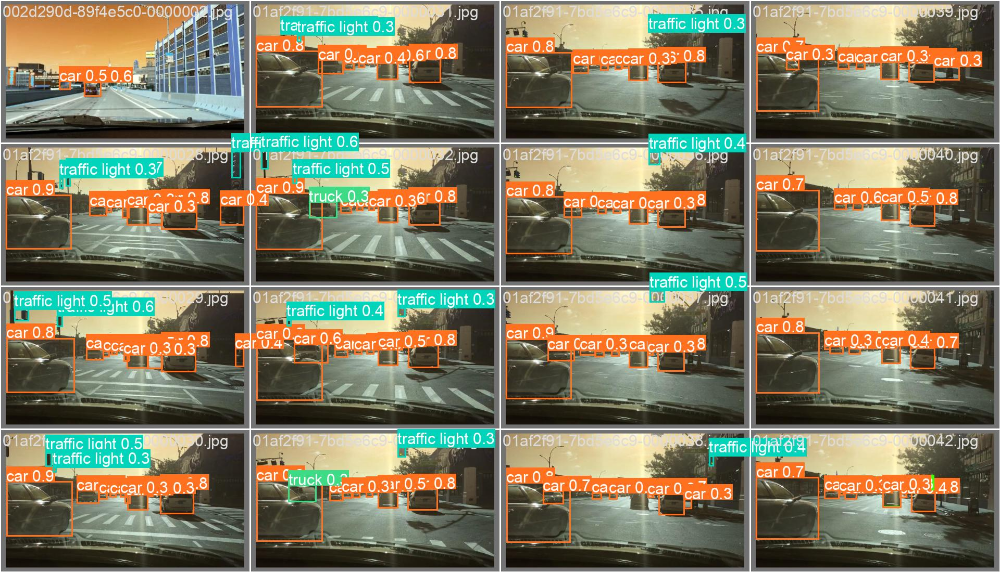

In [90]:
%cd {HOME}
Image(filename='/home/ubuntu/runs/detect/val4/val_batch0_pred.jpg', height=300)

/home/ubuntu/project/ESE546_final_project


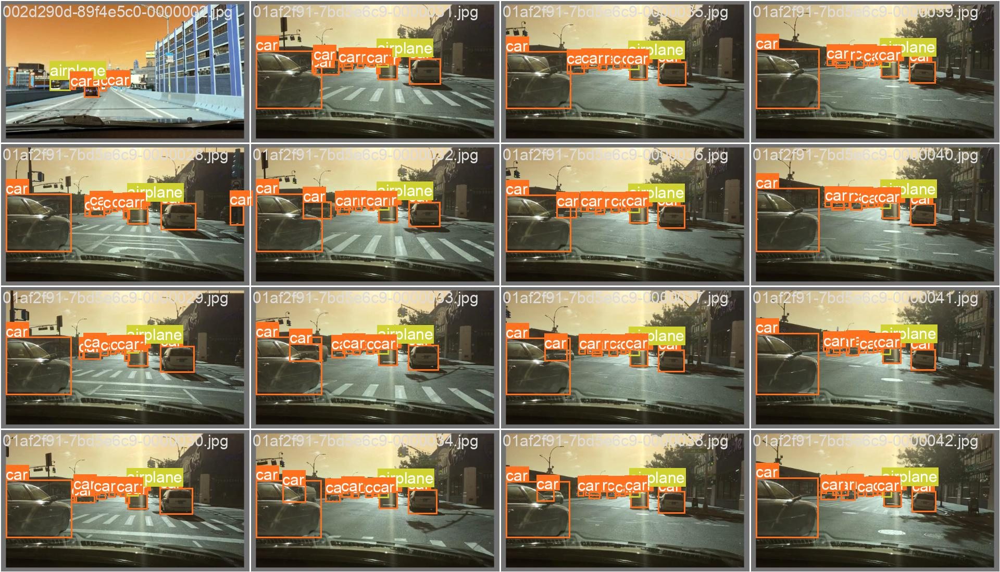

In [91]:
%cd {HOME}
Image(filename='/home/ubuntu/runs/detect/val4/val_batch0_labels.jpg', height=300)

/home/ubuntu/project/ESE546_final_project


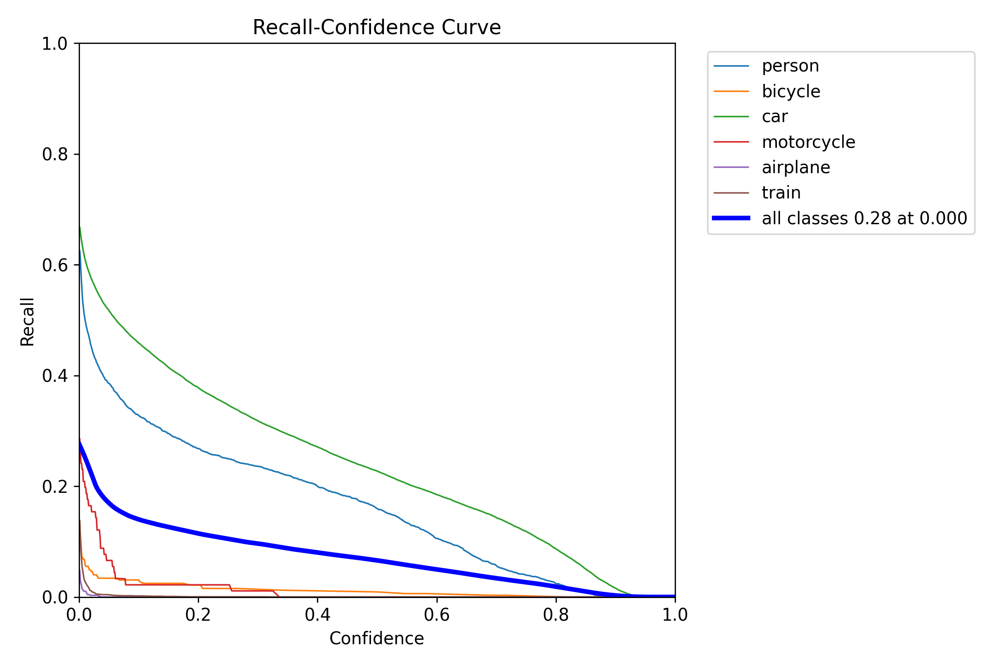

In [103]:
%cd {HOME}
recall_confidence_val_b4_train = Image(filename='/home/ubuntu/runs/detect/val4/R_curve.png', height=300)
recall_confidence_val_b4_train

In [52]:
import shutil 

In [105]:
# Define the paths
source_path = '/home/ubuntu/runs/detect/val4/R_curve.png'  # Original image path
destination_path = './yolo_recall_confidence_val_b4_train.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

Image saved successfully at ./yolo_recall_confidence_val_b4_train.png


/home/ubuntu/project/ESE546_final_project


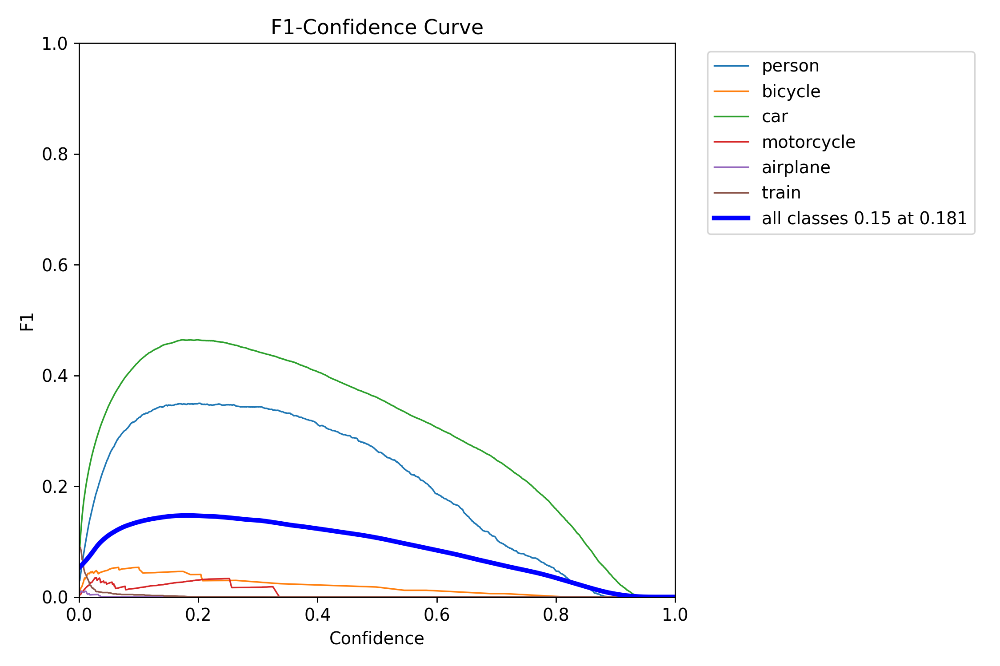

In [106]:
%cd {HOME}
f1_confidence_val_b4_train = Image(filename='/home/ubuntu/runs/detect/val4/F1_curve.png', height=300)
f1_confidence_val_b4_train

In [107]:
# Define the paths
source_path = '/home/ubuntu/runs/detect/val4/F1_curve.png'  # Original image path
destination_path = './yolo_f1_confidence_val_b4_train.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

Image saved successfully at ./yolo_f1_confidence_val_b4_train.png


/home/ubuntu/project/ESE546_final_project


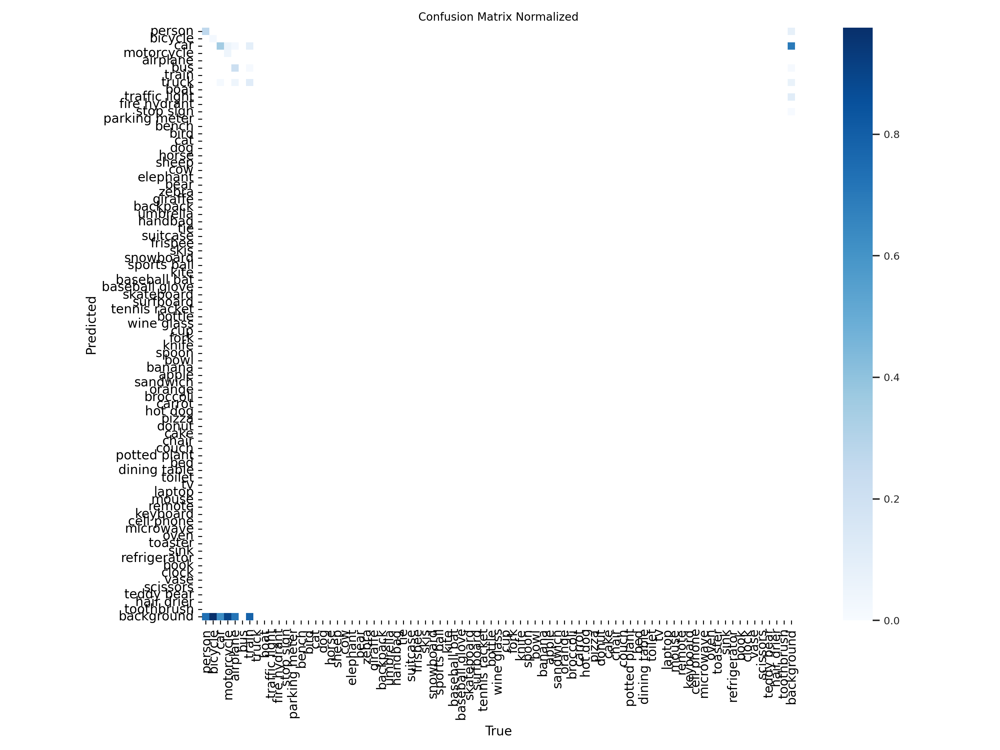

In [108]:

%cd {HOME}
confusion_matrix_val_b4_train = Image(filename='/home/ubuntu/runs/detect/val4/confusion_matrix_normalized.png', height=300)
confusion_matrix_val_b4_train

In [109]:
# Define the paths
source_path = '/home/ubuntu/runs/detect/val4/confusion_matrix_normalized.png'  # Original image path
destination_path = './yolo_confusion_matrix_val_b4_train.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

Image saved successfully at ./yolo_confusion_matrix_val_b4_train.png


/home/ubuntu/project/ESE546_final_project


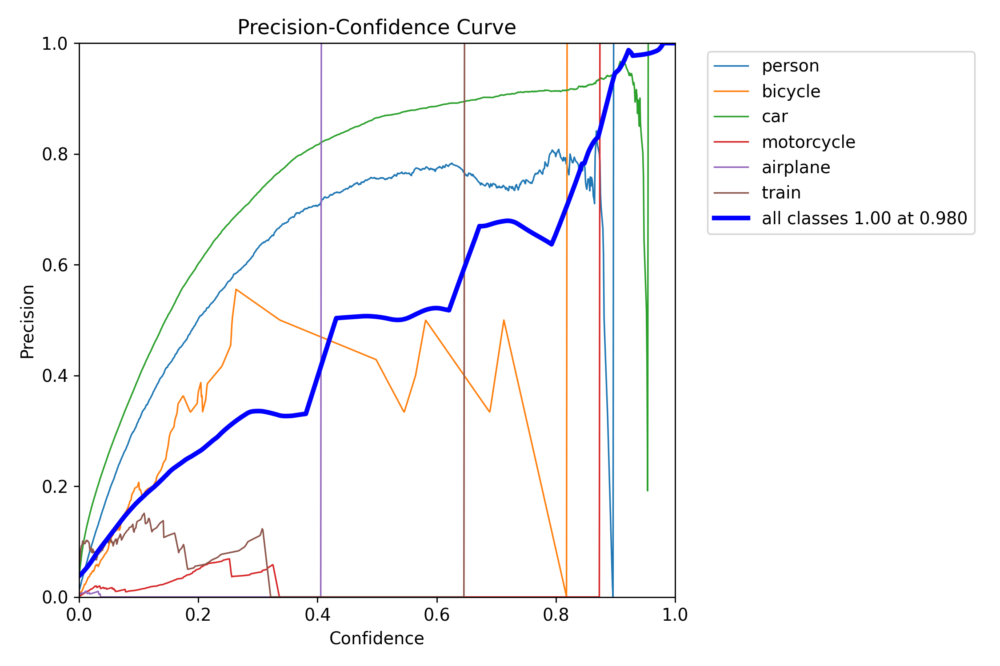

In [110]:
%cd {HOME}
precision_confidence_val_b4_train = Image(filename='/home/ubuntu/runs/detect/val4/P_curve.png', height=300)
precision_confidence_val_b4_train

In [111]:
# Define the paths
source_path = '/home/ubuntu/runs/detect/val4/P_curve.png'  # Original image path
destination_path = './yolo_precision_confidence_val_b4_train.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

Image saved successfully at ./yolo_precision_confidence_val_b4_train.png


/home/ubuntu/project/ESE546_final_project


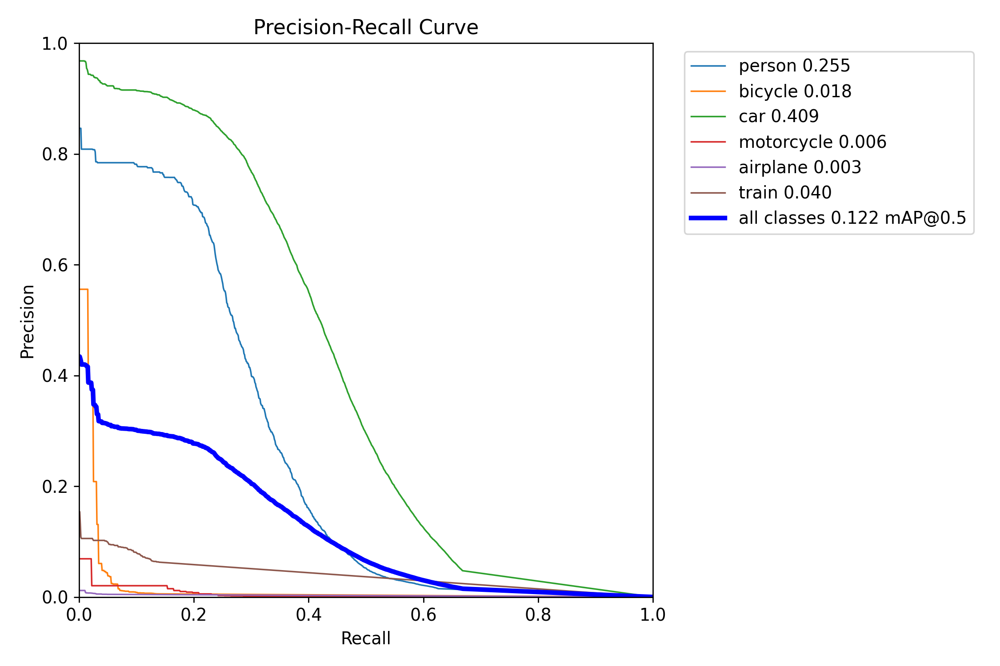

In [112]:
%cd {HOME}
precision_recall_val_b4_train = Image(filename='/home/ubuntu/runs/detect/val4/PR_curve.png', height=300)
precision_recall_val_b4_train

In [113]:
# Define the paths
source_path = '/home/ubuntu/runs/detect/val4/PR_curve.png'  # Original image path
destination_path = './yolo_precision_recall_val_b4_train.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

Image saved successfully at ./yolo_precision_recall_val_b4_train.png


# Train + Validation (after retraining)

In [47]:
model = YOLO(f'{HOME}/yolov8n.pt')


In [48]:
# TRAIN:

'''
integer representations of the class labels of interest in the coco128.yaml file
0: person
1: bicycle
2: car
3: motorcycle
4: bus
5: train
6: truck
'''


# train_results = model.train(data="coco128.yaml", classes=7, epochs=3)
train_results = model.train(data="coco128.yaml", classes=[0,1,2,3,4,5,6], epochs=2)
train_results

New https://pypi.org/project/ultralytics/8.0.228 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.227 🚀 Python-3.11.5 torch-2.1.2 CUDA:0 (NVIDIA A10G, 22564MiB)
engine/trainer: task=detect, mode=train, model=/home/ubuntu/project/ese546finalproject/yolov8n.pt, data=coco128.yaml, epochs=2, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train30, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=[0, 1, 2, 3, 4, 5, 6], retina_masks=False, show=False, save_fra

  8                  -1  1    460288  ultralytics.nn.modules.block.C2f             [256, 256, 1, True]           
  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  1    148224  ultralytics.nn.modules.block.C2f             [384, 128, 1]                 
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  1     37248  ultralytics.nn.modules.block.C2f             [192, 64, 1]                  
 16                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 

train: Scanning /home/ubuntu/datasets/train_frames_small_yolo.cache... 15518 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15518/15518 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/ubuntu/datasets/test_frames_small_yolo.cache... 3807 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3807/3807 [00:00<?, ?it/s]


Plotting labels to /home/ubuntu/runs/detect/train30/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/ubuntu/runs/detect/train30
Starting training for 2 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/2      3.05G      1.667      1.633      1.233        257        640: 100%|██████████| 970/970 [02:30<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 119/119 [00:20<00:00,  5.86it/s]


                   all       3807      36111      0.259      0.155      0.151     0.0731

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/2      2.56G        1.5      1.109      1.154        247        640: 100%|██████████| 970/970 [02:25<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 119/119 [00:19<00:00,  6.03it/s]


                   all       3807      36111      0.303      0.179       0.17     0.0799

2 epochs completed in 0.095 hours.
Optimizer stripped from /home/ubuntu/runs/detect/train30/weights/last.pt, 6.2MB
Optimizer stripped from /home/ubuntu/runs/detect/train30/weights/best.pt, 6.2MB

Validating /home/ubuntu/runs/detect/train30/weights/best.pt...
Ultralytics YOLOv8.0.227 🚀 Python-3.11.5 torch-2.1.2 CUDA:0 (NVIDIA A10G, 22564MiB)
Model summary (fused): 168 layers, 3007013 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 119/119 [00:23<00:00,  5.11it/s]


                   all       3807      36111      0.316       0.18       0.17       0.08
               class_0       3807       3175       0.45      0.316       0.29     0.0994
               class_1       3807        325      0.155    0.00615     0.0099    0.00188
               class_2       3807      28744      0.607      0.509      0.525      0.279
               class_3       3807         91      0.116      0.044     0.0192     0.0043
               class_4       3807        680      0.136     0.0838     0.0568       0.04
               class_6       3807       3096      0.429      0.122       0.12     0.0551
Speed: 0.1ms preprocess, 0.5ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /home/ubuntu/runs/detect/train30


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f489c3e3950>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

* analyze validation results after training

In [49]:
%cd {HOME}
detect_results = os.listdir("/home/ubuntu/runs/detect/train30")
detect_results


/home/ubuntu/project/ese546finalproject


['val_batch1_pred.jpg',
 'confusion_matrix.png',
 'labels.jpg',
 'val_batch0_labels.jpg',
 'val_batch2_pred.jpg',
 'val_batch0_pred.jpg',
 'R_curve.png',
 'F1_curve.png',
 'val_batch1_labels.jpg',
 'val_batch2_labels.jpg',
 'confusion_matrix_normalized.png',
 'train_batch0.jpg',
 'P_curve.png',
 'train_batch2.jpg',
 'results.csv',
 'args.yaml',
 'labels_correlogram.jpg',
 'PR_curve.png',
 'weights',
 'train_batch1.jpg',
 'results.png']

In [50]:
import shutil

/home/ubuntu/project/ese546finalproject
Image saved successfully at yolo_trained_results/results.png


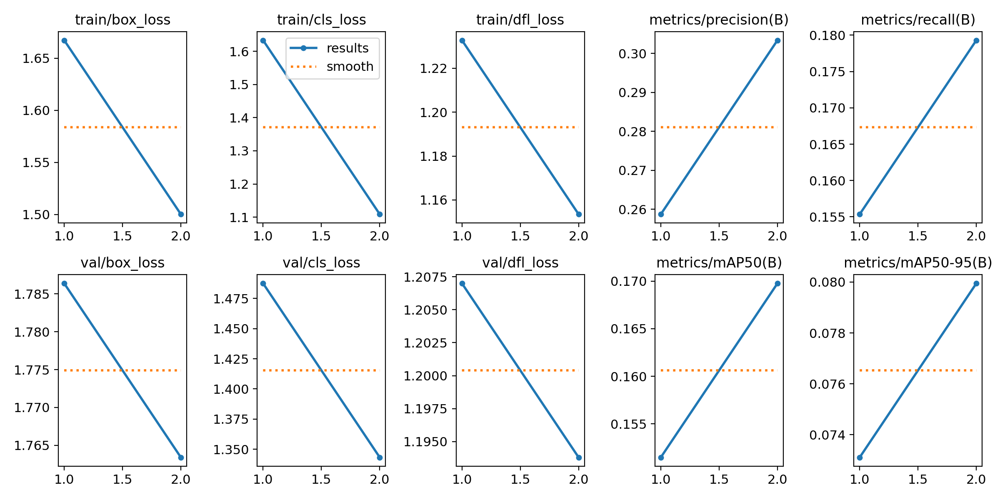

In [51]:
%cd {HOME}
yolo_v8_trained_results = Image(filename='/home/ubuntu/runs/detect/train30/results.png', height=300)

# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/results.png'  # Original image path
destination_path = 'yolo_trained_results/results.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

yolo_v8_trained_results

In [52]:
training_results_df = pd.read_csv('/home/ubuntu/runs/detect/train30/results.csv')
training_results_df.head()



,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,1.6672,1.6333,1.2328,0.25875,0.15536,0.15148,0.07311,1.7864,1.4876,1.2070,0.000303,0.000303,0.000303
1,2,1.5002,1.1088,1.1535,0.30340,0.17930,0.16976,0.07995,1.7634,1.3432,1.1938,0.000306,0.000306,0.000306


In [53]:
training_results_df.to_csv('yolo_trained_results/yolo_trained_results.csv', index=False)

/home/ubuntu/project/ese546finalproject
Image saved successfully at yolo_trained_results/PR_curve.png


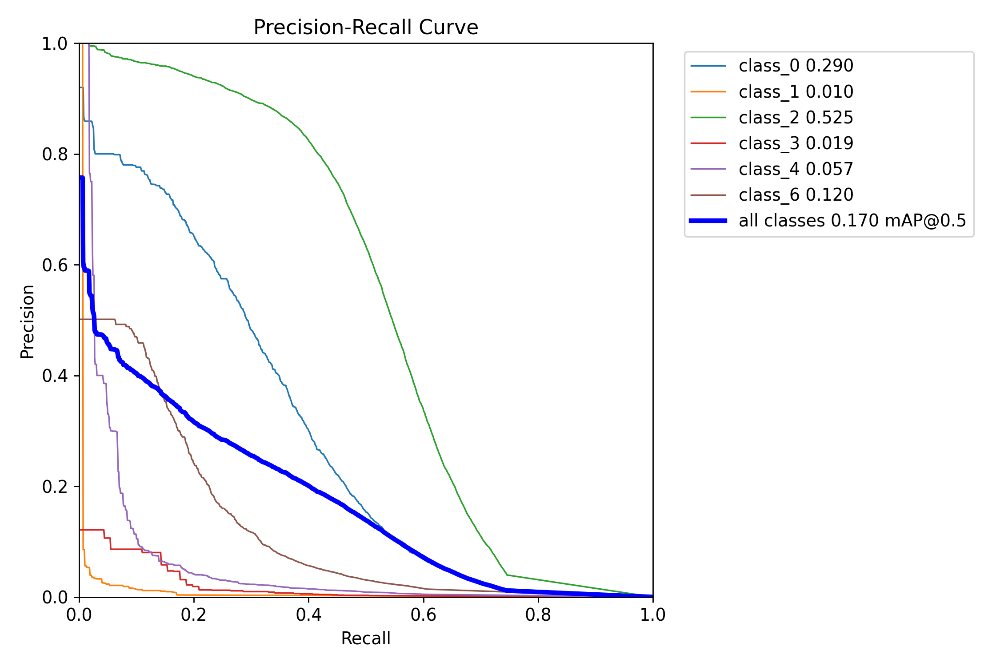

In [54]:
%cd {HOME}
yolo_v8_trained_PR = Image(filename='/home/ubuntu/runs/detect/train30/PR_curve.png', height=300)

# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/PR_curve.png'  # Original image path
destination_path = 'yolo_trained_results/PR_curve.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

yolo_v8_trained_PR


/home/ubuntu/project/ese546finalproject
Image saved successfully at yolo_trained_results/P_curve.png


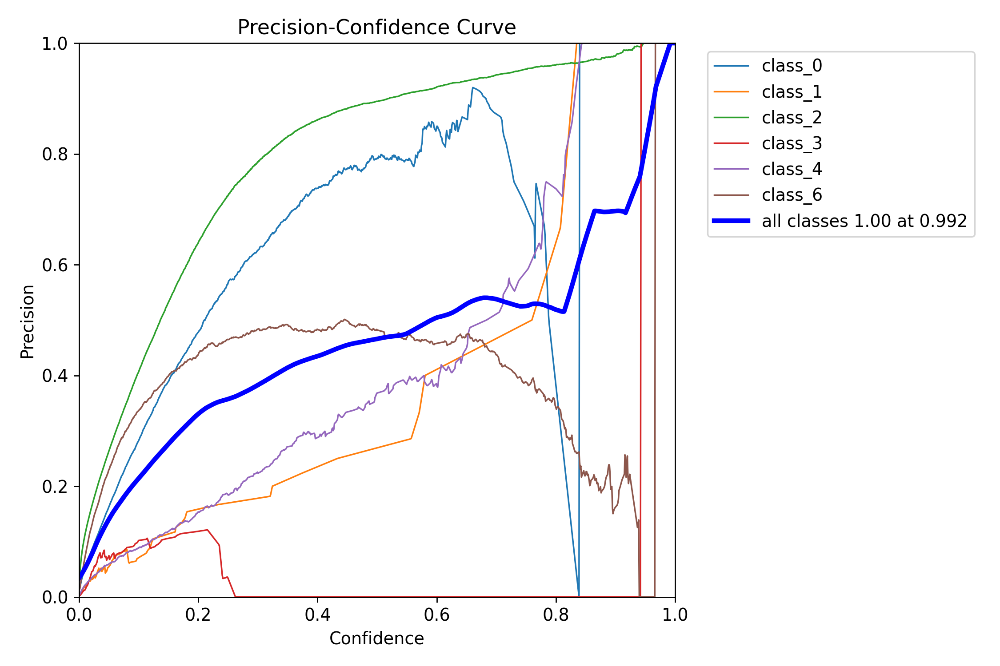

In [55]:
%cd {HOME}
yolo_v8_trained_Pcurve = Image(filename='/home/ubuntu/runs/detect/train30/P_curve.png', height=300)

# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/P_curve.png'  # Original image path
destination_path = 'yolo_trained_results/P_curve.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

yolo_v8_trained_Pcurve


/home/ubuntu/project/ese546finalproject
Image saved successfully at yolo_trained_results/confusion_matrix_normalized.png


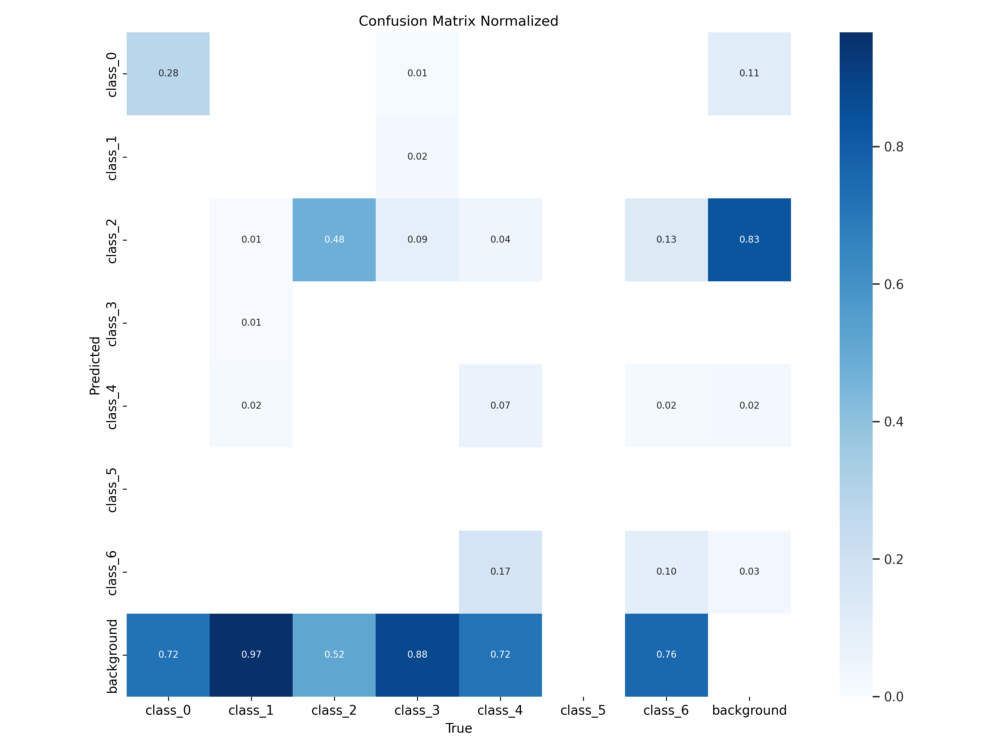

In [56]:


%cd {HOME}
yolo_v8_trained_CM = Image(filename='/home/ubuntu/runs/detect/train30/confusion_matrix_normalized.png', height=300)

# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/confusion_matrix_normalized.png'  # Original image path
destination_path = 'yolo_trained_results/confusion_matrix_normalized.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

yolo_v8_trained_CM

/home/ubuntu/project/ese546finalproject
Image saved successfully at yolo_trained_results/F1_curve.png


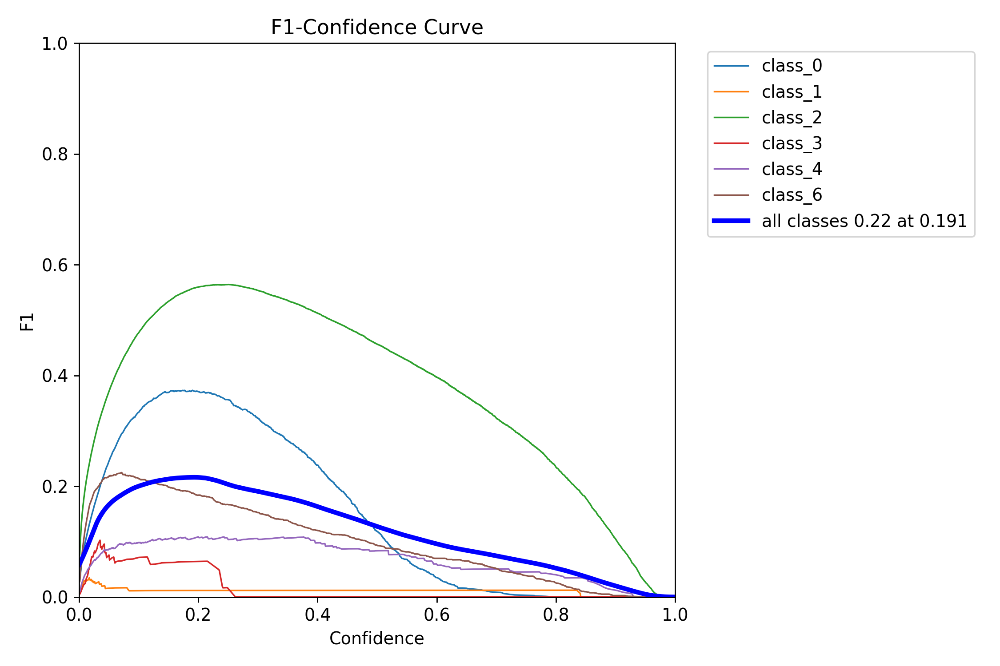

In [57]:
%cd {HOME}
yolo_v8_trained_F1_curve = Image(filename='/home/ubuntu/runs/detect/train30/F1_curve.png', height=300)

# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/F1_curve.png'  # Original image path
destination_path = 'yolo_trained_results/F1_curve.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

yolo_v8_trained_F1_curve

/home/ubuntu/project/ese546finalproject
Image saved successfully at yolo_trained_results/R_curve.png


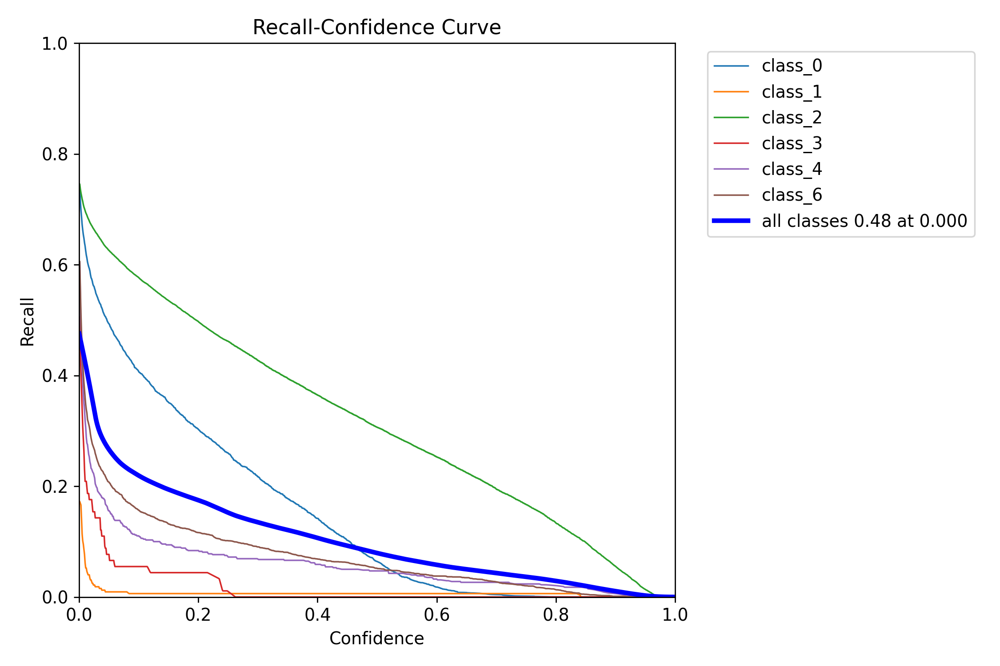

In [58]:
%cd {HOME}
yolo_v8_trained_R_curve = Image(filename='/home/ubuntu/runs/detect/train30/R_curve.png', height=300)

# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/R_curve.png'  # Original image path
destination_path = 'yolo_trained_results/R_curve.png'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

yolo_v8_trained_R_curve

/home/ubuntu/project/ese546finalproject
Image saved successfully at yolo_trained_results/labels.jpg


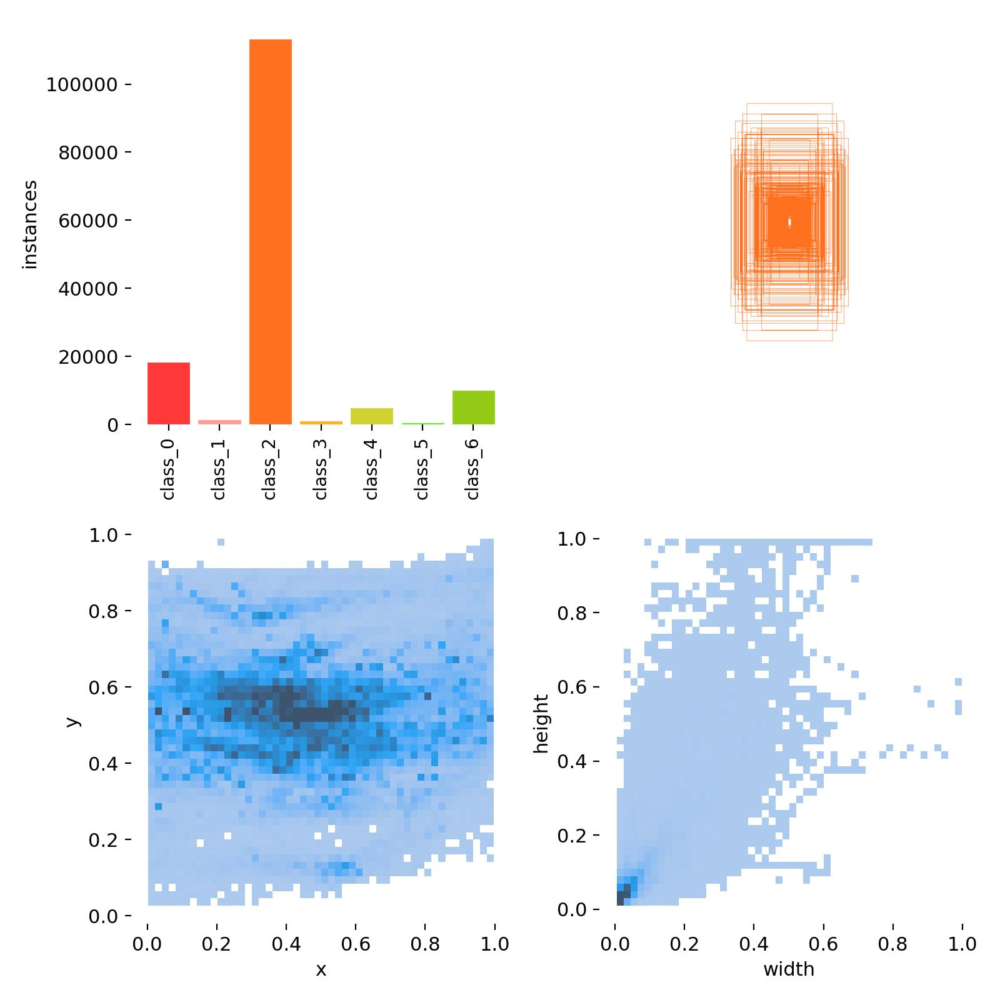

In [59]:
%cd {HOME}
yolo_v8_trained_labels = Image(filename='/home/ubuntu/runs/detect/train30/labels.jpg', height=300)

# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/labels.jpg'  # Original image path
destination_path = 'yolo_trained_results/labels.jpg'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

yolo_v8_trained_labels

/home/ubuntu/project/ese546finalproject
Image saved successfully at yolo_trained_results/labels_correlogram.jpg


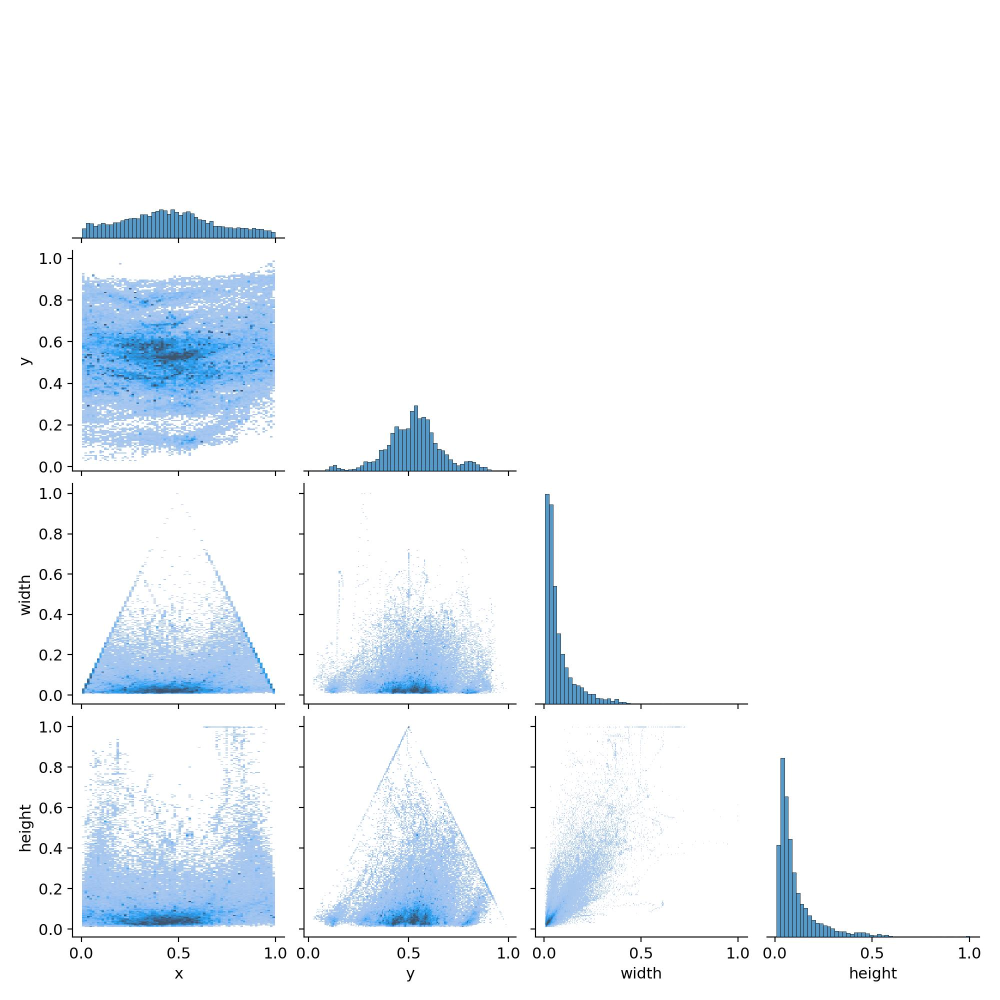

In [60]:
%cd {HOME}
yolo_v8_trained_labels_correlogram = Image(filename='/home/ubuntu/runs/detect/train30/labels_correlogram.jpg', height=300)

# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/labels_correlogram.jpg'  # Original image path
destination_path = 'yolo_trained_results/labels_correlogram.jpg'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

yolo_v8_trained_labels_correlogram

In [ ]:
'''
other files

- weights
- args.yaml
'''

* Saving the trained weights of the best performing model

In [61]:
# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/weights/best.pt'  # Original image path
destination_path = 'yolo_trained_results/best.pt'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Model weights saved successfully at {destination_path}")
else:
    print("Failed to save.")




Model weights saved successfully at yolo_trained_results/best.pt


In [62]:
# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/args.yaml'  # Original image path
destination_path = 'yolo_trained_results/args.yaml'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Args saved successfully at {destination_path}")
else:
    print("Failed to save.")


Args saved successfully at yolo_trained_results/args.yaml


In [ ]:
['val_batch1_pred.jpg',
 'confusion_matrix.png',
 'labels.jpg',
 'val_batch0_labels.jpg',
 'val_batch2_pred.jpg',
 'val_batch0_pred.jpg',
 'R_curve.png',
 'F1_curve.png',
 'val_batch1_labels.jpg',
 'val_batch2_labels.jpg',
 'confusion_matrix_normalized.png',
 'train_batch0.jpg',
 'P_curve.png',
 'train_batch2.jpg',
 'results.csv',
 'args.yaml',
 'labels_correlogram.jpg',
 'PR_curve.png',
 'weights',
 'train_batch1.jpg',
 'results.png']

/home/ubuntu/project/ese546finalproject
Image saved successfully at yolo_trained_results/val_batch1_labels.jpg


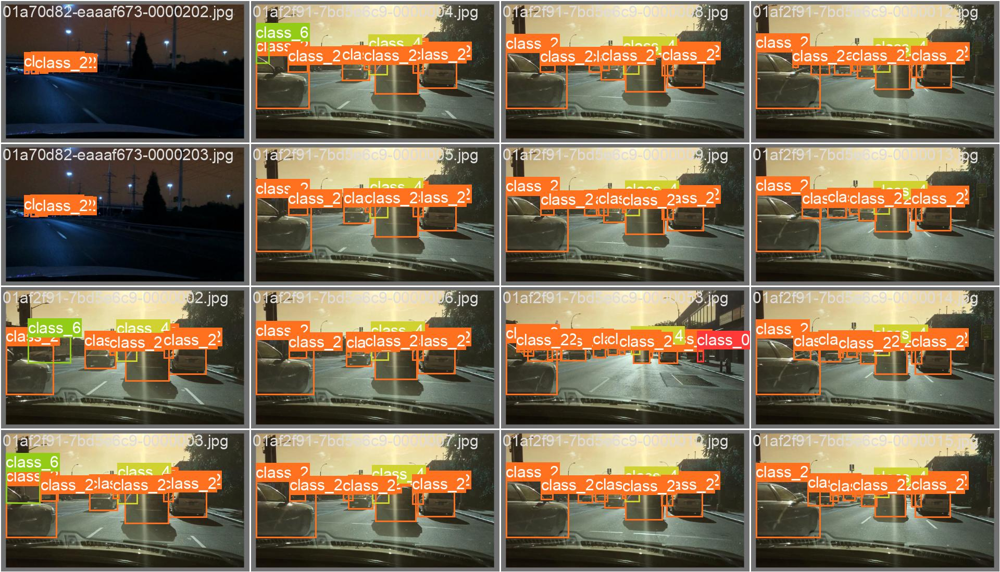

In [63]:
%cd {HOME}
yolo_v8_trained_val_batch1_labels = Image(filename='/home/ubuntu/runs/detect/train30/val_batch1_labels.jpg', height=300)

# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/val_batch1_labels.jpg'  # Original image path
destination_path = 'yolo_trained_results/val_batch1_labels.jpg'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

yolo_v8_trained_val_batch1_labels

/home/ubuntu/project/ese546finalproject
Image saved successfully at yolo_trained_results/val_batch1_pred.jpg


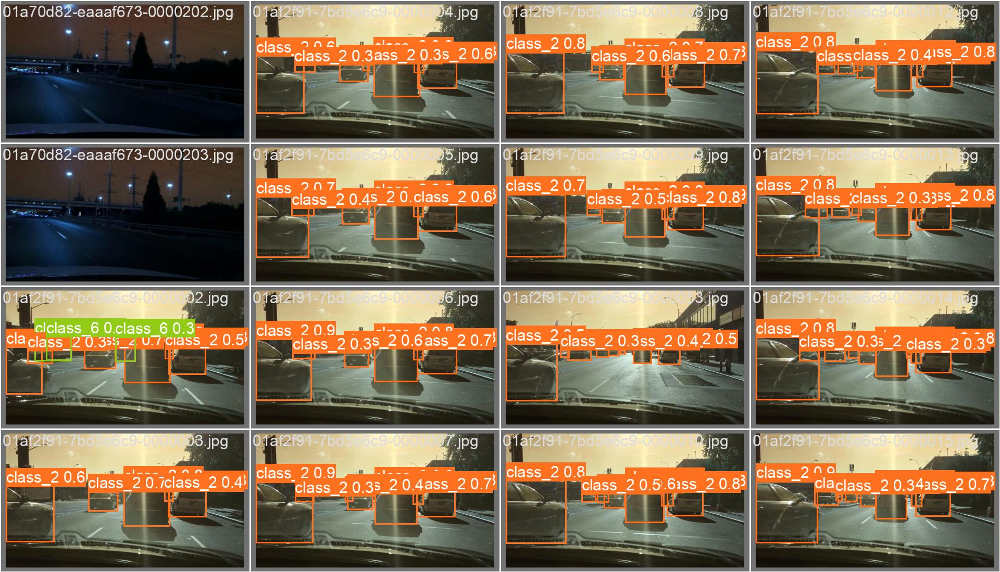

In [64]:
%cd {HOME}
yolo_v8_trained_val_batch1_pred = Image(filename='/home/ubuntu/runs/detect/train30/val_batch1_pred.jpg', height=300)

# Define the paths
source_path = '/home/ubuntu/runs/detect/train30/val_batch1_pred.jpg'  # Original image path
destination_path = 'yolo_trained_results/val_batch1_pred.jpg'  # Destination path to save the image

# Copy the file to the new destination
shutil.copyfile(source_path, destination_path)

# Verify if the file is saved
if os.path.exists(destination_path):
    print(f"Image saved successfully at {destination_path}")
else:
    print("Failed to save the image.")

yolo_v8_trained_val_batch1_pred

# Combining YOLO & Optic Flow

In [65]:
# load trained YOLO model in:
model = YOLO(f'yolo_trained_results/best.pt')


### test on one image:

In [66]:
# X_train_df = pd.read_csv('train_videos_small.csv', header = None, index_col = 0)
X_test_df = pd.read_csv('test_videos_small.csv', header = None, index_col = 0)

# X_train_list = list(X_train_df[1])
X_test_list = list(X_test_df[1])

# len(X_train_list), len(X_test_list)
len(X_test_list)

20

In [67]:
# train_df = df_cleaned[df_cleaned['videoName'].isin(X_train_list)].copy()
test_df = df_cleaned[df_cleaned['videoName'].isin(X_test_list)].copy()
test_df.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,x,y,w,h
97649,019d0e2f-26b8c896-0000002.jpg,019d0e2f-26b8c896,1,93510.0,car,False,False,True,1209.284065,1279.538106,211.177829,270.207852,True,1209.284065,211.177829,70.254042,59.030023
97650,019d0e2f-26b8c896-0000002.jpg,019d0e2f-26b8c896,1,93512.0,car,False,False,True,0.000000,175.451264,255.242494,362.494226,True,0.000000,255.242494,175.451264,107.251732
97651,019d0e2f-26b8c896-0000002.jpg,019d0e2f-26b8c896,1,93511.0,car,False,True,True,0.000000,77.978339,245.265589,267.725632,True,0.000000,245.265589,77.978339,22.460043
97652,019d0e2f-26b8c896-0000002.jpg,019d0e2f-26b8c896,1,93513.0,car,False,False,False,291.119134,392.009238,218.802001,301.946762,True,291.119134,218.802001,100.890104,83.144760
97653,019d0e2f-26b8c896-0000002.jpg,019d0e2f-26b8c896,1,93514.0,car,False,False,False,397.631872,459.484203,226.928933,281.016166,True,397.631872,226.928933,61.852331,54.087234


* ensuring the dataframe for teh dataframe of the subset of test videos has all appropriate and necessaary columns:

    * fixing the misnamed catgeory names, including center coordinates, and including wight and height correctly

In [68]:
# MAKE SURE COLUMN CHANGES HAVE BEEN MADE APPROPRIATELY FOR THE TEST DATAFRAME:

# replace values in the 'category' column based on condition
test_df.loc[test_df['category'] == 'pedestrian', 'category'] = 'person'
test_df.loc[test_df['category'] == 'rider', 'category'] = 'person'
test_df.loc[test_df['category'] == 'other person', 'category'] = 'person'

# create a Boolean mask for the rows to remove
mask = test_df['category'] == 'trailer'
# select all rows except the ones that contain 'Coca Cola'
test_df = test_df[~mask]

# create a Boolean mask for the rows to remove
mask = test_df['category'] == 'other vehicle'
# select all rows except the ones that contain 'Coca Cola'
test_df = test_df[~mask]


# make sure the test_df has all the new columns added that are needed (x_center, y_center, classes, width, height):

test_df['class'] = test_df['category'].apply(lambda x: labels_ints[x])

test_df['x_center'] = ((test_df['box2d.x1'] + test_df['box2d.x2'])/2) / 1280
test_df['y_center'] = ((test_df['box2d.y1'] + test_df['box2d.y2'])/2) / 720
test_df['width'] = ((test_df['box2d.x2'] - test_df['box2d.x1'])) / 1280
test_df['height'] = ((test_df['box2d.y2'] - test_df['box2d.y1'])) / 720
test_df.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,...,haveVideo,x,y,w,h,class,x_center,y_center,width,height
97649,019d0e2f-26b8c896-0000002.jpg,019d0e2f-26b8c896,1,93510.0,car,False,False,True,1209.284065,1279.538106,...,True,1209.284065,211.177829,70.254042,59.030023,2,0.972196,0.334296,0.054886,0.081986
97650,019d0e2f-26b8c896-0000002.jpg,019d0e2f-26b8c896,1,93512.0,car,False,False,True,0.000000,175.451264,...,True,0.000000,255.242494,175.451264,107.251732,2,0.068536,0.428984,0.137071,0.148961
97651,019d0e2f-26b8c896-0000002.jpg,019d0e2f-26b8c896,1,93511.0,car,False,True,True,0.000000,77.978339,...,True,0.000000,245.265589,77.978339,22.460043,2,0.030460,0.356244,0.060921,0.031195
97652,019d0e2f-26b8c896-0000002.jpg,019d0e2f-26b8c896,1,93513.0,car,False,False,False,291.119134,392.009238,...,True,291.119134,218.802001,100.890104,83.144760,2,0.266847,0.361631,0.078820,0.115479
97653,019d0e2f-26b8c896-0000002.jpg,019d0e2f-26b8c896,1,93514.0,car,False,False,False,397.631872,459.484203,...,True,397.631872,226.928933,61.852331,54.087234,2,0.334811,0.352740,0.048322,0.075121


In [69]:
# test on one image:
video = X_test_list[0]
print(vid)
# path
path = '../../datasets/test_frames_small_yolo/'
print(path)

frame = path + vid
print(frame)

002d290d-89f4e5c0
../../datasets/test_frames_small_yolo/
../../datasets/test_frames_small_yolo/002d290d-89f4e5c0


In [70]:
one_video_sample_df = test_df[test_df['videoName'] == video]
one_video_sample_df.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,...,haveVideo,x,y,w,h,class,x_center,y_center,width,height
552906,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2463.0,car,False,False,False,419.820784,502.194311,...,True,419.820784,435.611265,82.373527,63.648900,2,0.360162,0.649216,0.064354,0.088401
552907,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2464.0,car,False,False,False,507.110913,539.444596,...,True,507.110913,433.865225,32.333682,31.013940,2,0.408811,0.624128,0.025261,0.043075
552908,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2465.0,bus,False,True,False,236.620701,346.268823,...,True,236.620701,399.913282,109.648122,63.699732,4,0.227691,0.599671,0.085663,0.088472
552909,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2466.0,car,False,True,False,344.782631,374.023981,...,True,344.782631,438.484323,29.241349,18.476390,2,0.280784,0.621837,0.022845,0.025662
552910,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2467.0,car,False,True,False,545.965319,559.853640,...,True,545.965319,433.778536,13.888320,9.258880,2,0.431961,0.608900,0.010850,0.012860


In [71]:
one_video_sample_df.reset_index(inplace=True)
one_video_sample_df.head()


,index,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,...,haveVideo,x,y,w,h,class,x_center,y_center,width,height
0,552906,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2463.0,car,False,False,False,419.820784,...,True,419.820784,435.611265,82.373527,63.648900,2,0.360162,0.649216,0.064354,0.088401
1,552907,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2464.0,car,False,False,False,507.110913,...,True,507.110913,433.865225,32.333682,31.013940,2,0.408811,0.624128,0.025261,0.043075
2,552908,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2465.0,bus,False,True,False,236.620701,...,True,236.620701,399.913282,109.648122,63.699732,4,0.227691,0.599671,0.085663,0.088472
3,552909,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2466.0,car,False,True,False,344.782631,...,True,344.782631,438.484323,29.241349,18.476390,2,0.280784,0.621837,0.022845,0.025662
4,552910,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2467.0,car,False,True,False,545.965319,...,True,545.965319,433.778536,13.888320,9.258880,2,0.431961,0.608900,0.010850,0.012860


In [72]:
one_video_sample_df['name'][0]


'002d290d-89f4e5c0-0000002.jpg'

In [73]:

img = cv.imread('../../datasets/test_frames_small_yolo/002d290d-89f4e5c0-0000002.jpg')


In [74]:
img.shape


(720, 1280, 3)

In [75]:
results = model.predict(img)


0: 384x640 2 class_2s, 126.7ms
Speed: 1.8ms preprocess, 126.7ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


In [76]:
results[0].boxes

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 2.], device='cuda:0')
conf: tensor([0.7146, 0.4158], device='cuda:0')
data: tensor([[4.2029e+02, 4.3601e+02, 5.0277e+02, 4.9950e+02, 7.1464e-01, 2.0000e+00],
        [5.0929e+02, 4.3713e+02, 5.4120e+02, 4.6575e+02, 4.1584e-01, 2.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (720, 1280)
shape: torch.Size([2, 6])
xywh: tensor([[461.5293, 467.7553,  82.4871,  63.4833],
        [525.2467, 451.4393,  31.9048,  28.6127]], device='cuda:0')
xywhn: tensor([[0.3606, 0.6497, 0.0644, 0.0882],
        [0.4103, 0.6270, 0.0249, 0.0397]], device='cuda:0')
xyxy: tensor([[420.2858, 436.0137, 502.7728, 499.4969],
        [509.2943, 437.1330, 541.1991, 465.7456]], device='cuda:0')
xyxyn: tensor([[0.3283, 0.6056, 0.3928, 0.6937],
        [0.3979, 0.6071, 0.4228, 0.6469]], device='cuda:0')

In [77]:
results[0].boxes.xywh.tolist()

[[461.529296875, 467.75531005859375, 82.487060546875, 63.4832763671875],
 [525.2467041015625, 451.4393005371094, 31.904815673828125, 28.6126708984375]]

In [78]:
import torchvision.transforms as transforms


In [79]:
# return bounding boxes for one image using YOLO
def get_YOLO_pred(image, target, image_id, model, criterion, device):
    # TODO
    # transform = transforms.ToTensor()
    # image = transform(image)
    
    # image = image.numpy().transpose(1, 2, 0)  # Convert from PyTorch tensor to NumPy array and change from CxHxW to HxWxC

    # print(image.shape)
    # print(image)
    
    results = model.predict(image)
    bboxes = results[0].boxes.xywh.tolist()
    
    return bboxes

In [70]:
# bboxes = get_YOLO_pred(img, __, __, model, __, device)
# bboxes

In [71]:
# model.predict(img)[0].boxes.xywh.tolist()
# print(img)

In [80]:
#OPTIC FLOW METHODS
def get_points_from_boxes(boxes):
    points = []
    box_id = 0
    # print('boxes:', boxes)
    for box in boxes:
        cx, cy, w, h = box
        x_min = cx - w / 2
        y_min = cy - h / 2
        x_max = cx + w / 2
        y_max = cy + h / 2

        center = (cx, cy)
        top_left = (x_min, y_min)
        top_right = (x_max, y_min)
        bottom_left = (x_min, y_max)
        bottom_right = (x_max, y_max)

        # Append points along with their box ID
        points.extend([(center, box_id), (top_left, box_id), (top_right, box_id), (bottom_left, box_id), (bottom_right, box_id)])
        box_id += 1

    # print('points:', points)

    return points


def reconstruct_boxes(tracked_points):
    boxes = []
    # Group points by box ID
    box_points = {}
    for point, box_id in tracked_points:
        if box_id not in box_points:
            box_points[box_id] = []
        box_points[box_id].append(point)
    
    # Reconstruct boxes from grouped points
    for points in box_points.values():
        # Assuming points contains all 5 points (center, 4 corners) for each box
        xs = [p[0] for p in points]
        ys = [p[1] for p in points]
        x = min(xs)
        y = min(ys)
        w = max(xs) - x
        h = max(ys) - y
        boxes.append([x+(w/2), y+(h/2), w, h])
#         boxes.append([x, y, w, h])

    return boxes

def convert_normalized_boxes(boxes, img_width, img_height):
    converted_boxes = []
    for box in boxes:
        x_center, y_center, width, height = box
        x_center_pixel = x_center * img_width
        y_center_pixel = y_center * img_height
        width_pixel = width * img_width
        height_pixel = height * img_height
        converted_boxes.append([x_center_pixel, y_center_pixel, width_pixel, height_pixel])
    return converted_boxes

def normalize_boxes(boxes, img_width, img_height):
    normalized_boxes = []
    for box in boxes:
        cx, cy, w, h = box
        cx_normalized = cx / img_width
        cy_normalized = cy / img_height
        w_normalized = w / img_width
        h_normalized = h / img_height
        normalized_boxes.append([cx_normalized, cy_normalized, w_normalized, h_normalized])
    return normalized_boxes

# cv2.calcOpticalFlowPyrLK(self.old_img, i_img, i_old_pts, None)

def get_OF_pred(prev_boxes, prev_img, curr_img, lk_params):
    # Extract points and their IDs from the previous bounding boxes
    prev_points_with_ids = get_points_from_boxes(prev_boxes)
    prev_points = np.array([pt for pt, _ in prev_points_with_ids], dtype=np.float32)

    # print('shape of prev_points: ', prev_points)

    # Convert images to grayscale for optical flow
    prev_gray = cv.cvtColor(prev_img, cv.COLOR_BGR2GRAY)
    curr_gray = cv.cvtColor(curr_img, cv.COLOR_BGR2GRAY)

    # print(prev_points)

    # Calculate optical flow to track points
    curr_points, status, _ = cv.calcOpticalFlowPyrLK(prev_gray, curr_gray, prev_points, None, **lk_params)
    status_flat = status.flatten()

    # Filter points and IDs based on the status
    good_points_with_ids = [(curr_points[i], id) for i, (_, id) in enumerate(prev_points_with_ids) if status_flat[i]]

    # Reconstruct bounding boxes from filtered points and IDs
    new_boxes = reconstruct_boxes(good_points_with_ids)

    loss = None  # Placeholder for loss calculation

    return loss, new_boxes

def draw_boxes(img, boxes, color, label):
    for box in boxes:
        cx, cy, w, h = box  # center_x, center_y, width, height
        x_min = int((cx - w / 2) * img.shape[1])
        y_min = int((cy - h / 2) * img.shape[0])
        x_max = int((cx + w / 2) * img.shape[1])
        y_max = int((cy + h / 2) * img.shape[0])
        cv.rectangle(img, (x_min, y_min), (x_max, y_max), color, 2)
        cv.putText(img, label, (x_min, y_min - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return img

def plot_boxes(img, of_box, model_box, frame_idx):
    img_width, img_height = 1280, 720
    
    model_box_norm = normalize_boxes(model_box, img_width, img_height)
    img_with_boxes = draw_boxes(img.copy(), model_box_norm, (0, 255, 0), "Model")

    of_box_norm = normalize_boxes(of_box, img_width, img_height)
    img_with_boxes = draw_boxes(img_with_boxes, of_box_norm, (0, 0, 255), "OF")
    

    # Visualize
    plt.figure(figsize=(15, 15))
    plt.imshow(cv.cvtColor(img_with_boxes, cv.COLOR_BGR2RGB))
    plt.title(f"Frame {frame_idx} with Actual and Predicted Boxes")
    plt.axis("off")
    plt.show()

In [81]:
def box_iou(box1, box2):
    # Calculate the (x, y)-coordinates of the intersection rectangle
    xA = max(box1[0] - box1[2] / 2, box2[0] - box2[2] / 2)
    yA = max(box1[1] - box1[3] / 2, box2[1] - box2[3] / 2)
    xB = min(box1[0] + box1[2] / 2, box2[0] + box2[2] / 2)
    yB = min(box1[1] + box1[3] / 2, box2[1] + box2[3] / 2)

    # Compute the area of intersection
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both bounding boxes
    box1Area = box1[2] * box1[3]
    box2Area = box2[2] * box2[3]

    # Compute the intersection over union
    iou = interArea / float(box1Area + box2Area - interArea)
    return iou

def compare_outputs(optic_flow_boxes, model_boxes):
    # Assuming both sets of boxes are in the format [center_x, center_y, width, height]
    # and that they are aligned (each box in one list corresponds to the box at the same index in the other list)
    ious = [box_iou(of_box, model_box) for of_box, model_box in zip(optic_flow_boxes, model_boxes)]
    avg_iou = sum(ious) / len(ious) if ious else 0
    return avg_iou

In [82]:
!pip install tqdm
from tqdm import tqdm

In [83]:
# model vs optic flow on ONE video
def model_vs_of(dataset, model, criterion, device, lk_params, model_type = 'YOLO', threshold = 0.75, show_results = False):
    num_frames = len(dataset)

    # if criterion == None:
        
    
    padding = 1
    last_model_idx = 0
    
    # if model_type == 'DETR':
    #     predictor = get_DETR_pred
    # else:
    predictor = get_YOLO_pred
        
    img_width, img_heigh = 1280, 720
    
    # model_frame_losses = np.zeros(num_frames)
    # of_frame_losses = np.zeros(num_frames)
    # total_frame_losses = np.zeros(num_frames)
    
    model_used = np.zeros(num_frames, dtype=bool)
    
    avg_running_loss = 0

    final_boxes = []
    
    for i, (img, target, img_id) in tqdm(enumerate(dataset)):

        # print('target: ',target['boxes'])
        
        image_np = img.numpy().transpose(1, 2, 0)  # Convert from PyTorch tensor to NumPy array and change from CxHxW to HxWxC
        image_np = (image_np * 255).astype(np.uint8)  # Convert from [0, 1] to [0, 255]
        image_bgr = cv.cvtColor(image_np, cv.COLOR_RGB2BGR)
        
        if i == 0:
            model_output = predictor(image_np, target, img_id, model, criterion, device) 
#             model_boxes = convert_normalized_boxes(model_output, img_width, img_height)
            model_boxes = model_output

            # print('model_boxes: ', model_boxes)
            
            if len(model_boxes) > 0:
                prev_output = model_boxes
            else:
                prev_output = target['boxes']
                ###
                print(prev_output)
                ###
            
            prev_img = image_bgr
            
            # model_frame_losses[i] = model_loss
            # total_frame_losses[i] = model_loss
            model_used[i] = True
            
        else:
            ##################
            of_loss, of_output = get_OF_pred(prev_output, prev_img, image_bgr, lk_params)  ### image_bgr --> image_np
            # of_frame_losses[i] = of_loss
            ##################
            
            if last_model_idx + padding == i:
                model_output = predictor(image_np, target, img_id, model, criterion, device) # TODO check inputs once written
#                 model_boxes = convert_normalized_boxes(model_output, img_width, img_height)
                model_boxes = model_output
                
                # model_frame_losses[i] = model_loss
                # total_frame_losses[i] = model_loss
                model_used[i] = True
                
                last_model_idx = i
                
                if len(model_boxes) > 0:
                    prev_output = model_boxes # here we assume that the model is "always right"
                
                box_diff = compare_outputs(of_output, model_boxes) # [0,1] range output - 1 is exact match
                
                if show_results:
                    print(i)
                    print(model_boxes)
                    print(of_output)
                    print(box_diff)
                    plot_boxes(image_bgr, of_output, model_boxes, i)
                    if i > 15:
                        break
                
                if box_diff < threshold: # bad optic flow results
                    padding = 1
                else: # good optic flow results, continue to pad
                    padding += 1
            
            else:
                if len(of_output) > 0:
                    prev_output = of_output 
                # total_frame_losses[i] = of_loss
            
            prev_img = image_bgr

        final_boxes.append(prev_output)


        
            
    return final_boxes, model_used

## Dataset Class + Parameters Used in DETR (not truly needed for YOLO)

In [84]:
lk_params = dict(winSize = (15,15),
                 maxLevel = 2,
                 criteria = (cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT, 10, 0.03))

In [85]:
n_folds = 5
seed = 42
num_classes = 7 #11
num_queries = 65 #changed from 100
null_class_coef = 0.5
BATCH_SIZE = 8
LR = 2e-5
EPOCHS = 2
device = torch.device('cuda')

In [86]:
def get_valid_transforms():
    return A.Compose([A.Resize(height=512, width=512, p=0),
                      ToTensorV2(p=1.0)],
                      p=1.0,
                      bbox_params=A.BboxParams(format='coco',min_area=0, min_visibility=0,label_fields=['labels'])
                      )

In [87]:
from torch.utils.data import Dataset,DataLoader


In [88]:
DIR_TRAIN = 'frames_v2'

class DrivingDataset(Dataset):
    def __init__(self,image_ids,dataframe,transforms=None):
        self.image_ids = image_ids
        self.df = dataframe
        self.transforms = transforms
        self.label_map = {'person': 0,
                   'bicycle': 1,
                   'car': 2,
                   'motorcycle': 3,
                   'bus': 4,
                   'train': 5,
                   'truck': 6}

    def __len__(self) -> int:
        return self.image_ids.shape[0]

    def __getitem__(self,index):
        image_id = self.image_ids[index]
        records = self.df[self.df['name'] == image_id]

        image = cv.imread(f'{DIR_TRAIN}/{image_id}', cv.IMREAD_COLOR).astype(np.float32)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0

        # DETR takes in data in coco format
        #boxes = records[['x', 'y', 'w', 'h']].values
        boxes = records[['x_center', 'y_center', 'w', 'h']].values

        #Area of bb
        area = boxes[:,2]*boxes[:,3]
        area = torch.as_tensor(area, dtype=torch.float32)

        # AS pointed out by PRVI It works better if the main class is labelled as zero
        labels = records['category'].values
        labels =  np.array([self.label_map[label] for label in labels], dtype=np.int32)


        if self.transforms:
            sample = {
                'image': image,
                'bboxes': boxes,
                'labels': labels
            }
            sample = self.transforms(**sample)
            image = sample['image']
            boxes = sample['bboxes']
            labels = sample['labels']


        #Normalizing BBOXES

        _,h,w = image.shape
        boxes = A.core.bbox_utils.normalize_bboxes(sample['bboxes'],rows=h,cols=w)
        target = {}
        target['boxes'] = torch.as_tensor(boxes,dtype=torch.float32)
        target['labels'] = torch.as_tensor(labels,dtype=torch.long)
        target['image_id'] = torch.tensor([index])
        target['area'] = area

        return image, target, image_id

In [89]:
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2



In [82]:


# from torch.utils.data import Dataset,DataLoader
# from torch.utils.data.sampler import SequentialSampler, RandomSampler

# from detr.models.matcher import HungarianMatcher
# from detr.models.detr import SetCriterion

In [83]:
# one_video_sample_df.name.unique()

In [90]:
video = X_test_list[0]
one_video_sample_df = test_df[test_df['videoName'] == video]
one_vid_dataset = DrivingDataset(image_ids=one_video_sample_df.name.unique(), 
                               dataframe=one_video_sample_df, 
                               transforms=get_valid_transforms())

In [91]:
one_video_sample_df.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,...,haveVideo,x,y,w,h,class,x_center,y_center,width,height
552906,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2463.0,car,False,False,False,419.820784,502.194311,...,True,419.820784,435.611265,82.373527,63.648900,2,0.360162,0.649216,0.064354,0.088401
552907,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2464.0,car,False,False,False,507.110913,539.444596,...,True,507.110913,433.865225,32.333682,31.013940,2,0.408811,0.624128,0.025261,0.043075
552908,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2465.0,bus,False,True,False,236.620701,346.268823,...,True,236.620701,399.913282,109.648122,63.699732,4,0.227691,0.599671,0.085663,0.088472
552909,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2466.0,car,False,True,False,344.782631,374.023981,...,True,344.782631,438.484323,29.241349,18.476390,2,0.280784,0.621837,0.022845,0.025662
552910,002d290d-89f4e5c0-0000002.jpg,002d290d-89f4e5c0,1,2467.0,car,False,True,False,545.965319,559.853640,...,True,545.965319,433.778536,13.888320,9.258880,2,0.431961,0.608900,0.010850,0.012860


### Running combination of YOLO & Optical Flow on one video:

0it [00:00, ?it/s]


0: 384x640 2 class_2s, 8.6ms
Speed: 1.5ms preprocess, 8.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.5ms
Speed: 1.4ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
1
[[468.84112548828125, 462.63946533203125, 83.35565185546875, 62.3582763671875], [528.8668212890625, 445.5546875, 36.6376953125, 29.9869384765625], [275.2704162597656, 439.2767639160156, 83.134765625, 34.955322265625]]
[[465.6927795410156, 462.69432067871094, 90.17139, 62.858246], [529.4466857910156, 446.3380584716797, 32.527527, 27.750824]]
0.8693363175620474


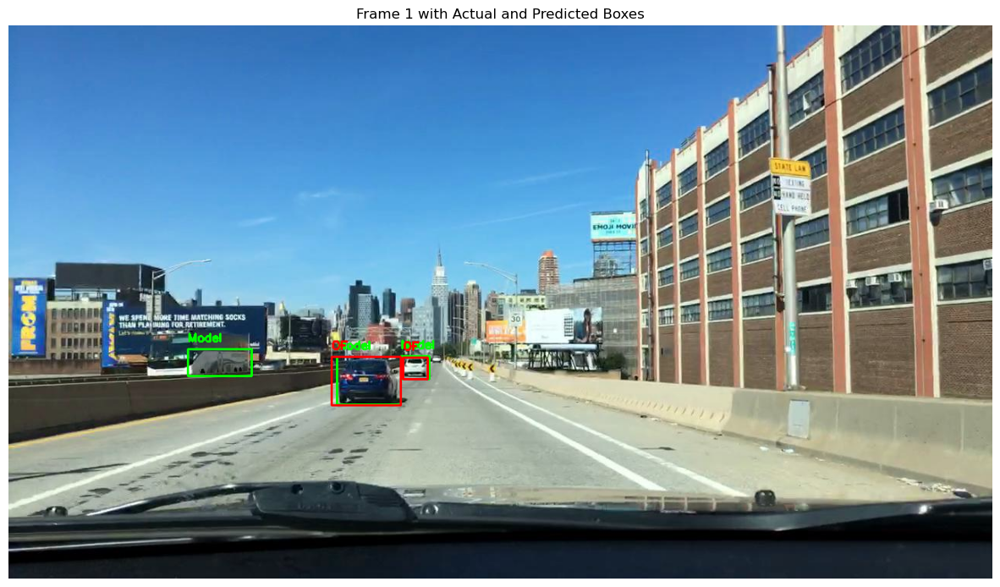

2it [00:00,  3.82it/s]


0: 384x640 5 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)
3
[[478.6165466308594, 465.92315673828125, 85.98870849609375, 59.5521240234375], [534.3681640625, 446.38250732421875, 33.47900390625, 30.46942138671875], [130.40609741210938, 442.95611572265625, 157.28387451171875, 47.93701171875], [150.11618041992188, 449.2183837890625, 113.07164764404297, 32.7794189453125], [106.93717193603516, 442.51446533203125, 210.16310119628906, 52.5166015625]]
[[471.79600524902344, 465.1888122558594, 96.12918, 60.58136], [533.2473754882812, 448.29339599609375, 38.210815, 29.020264], [165.15700149536133, 447.0844421386719, 259.2111, 47.462524]]
0.7155076909125316


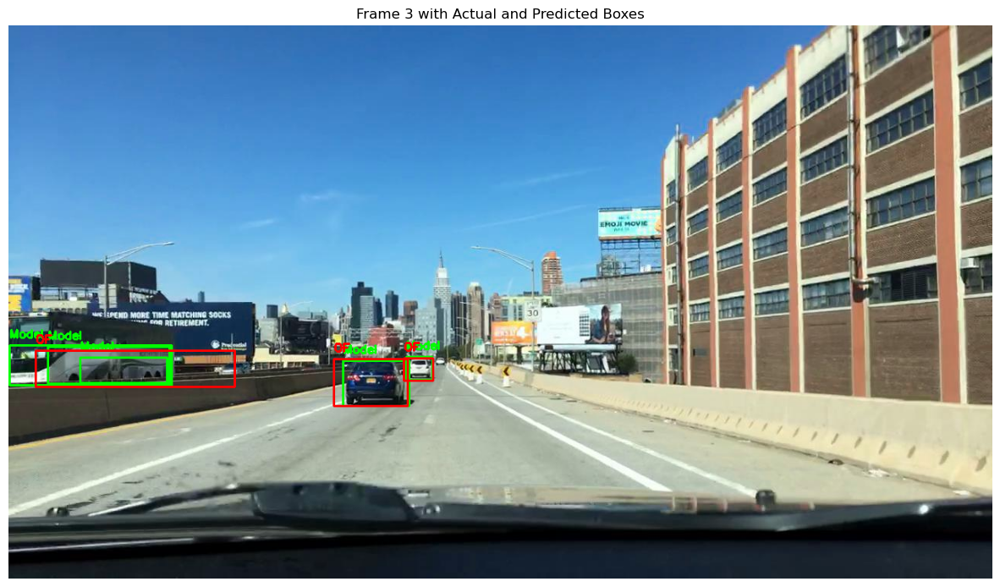

4it [00:01,  3.91it/s]


0: 384x640 2 class_2s, 1 class_6, 8.3ms
Speed: 1.2ms preprocess, 8.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
4
[[479.0656433105469, 473.44830322265625, 83.41790771484375, 61.4466552734375], [535.474609375, 454.5046691894531, 33.82421875, 27.62493896484375], [210.198486328125, 416.177734375, 190.77325439453125, 108.7713623046875]]
[[477.9394073486328, 473.8559265136719, 94.30881, 61.853638], [533.862060546875, 453.77239990234375, 35.34143, 31.171082], [128.0172348022461, 448.8507843017578, 150.19022, 56.58664], [147.5734100341797, 459.1061248779297, 107.261475, 33.987885], [191.53449058532715, 446.1664276123047, 358.18842, 65.07089]]
0.6201589772284638


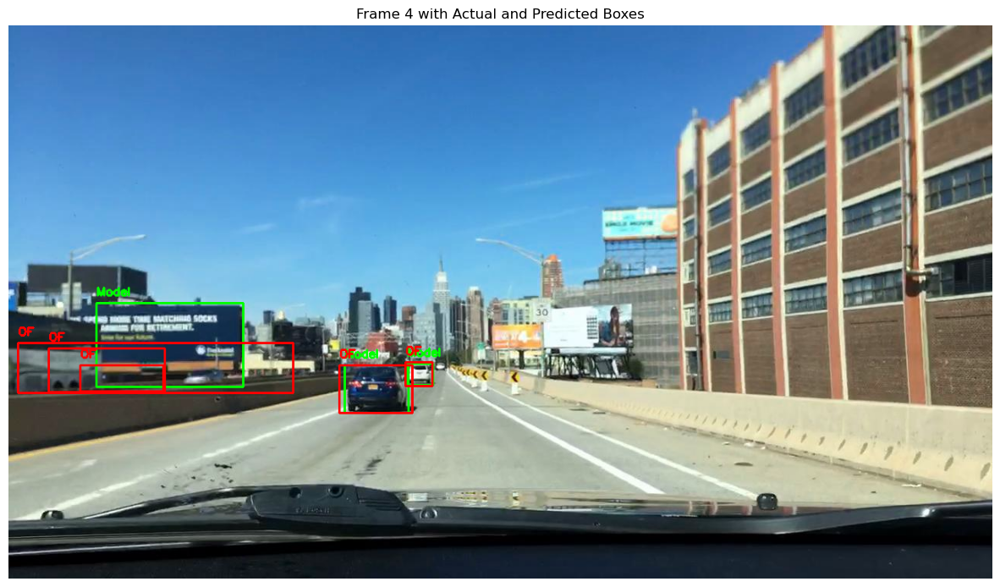

5it [00:01,  3.10it/s]


0: 384x640 2 class_2s, 9.1ms
Speed: 1.4ms preprocess, 9.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
5
[[481.719482421875, 468.8120422363281, 78.7119140625, 62.69049072265625], [534.265625, 447.75006103515625, 37.863525390625, 30.850830078125]]
[[476.3957061767578, 468.9873962402344, 86.60666, 63.410217], [534.9751586914062, 449.8678741455078, 35.146362, 27.70639], [188.22106170654297, 412.9343719482422, 203.66049, 115.1633]]
0.8365866897278932


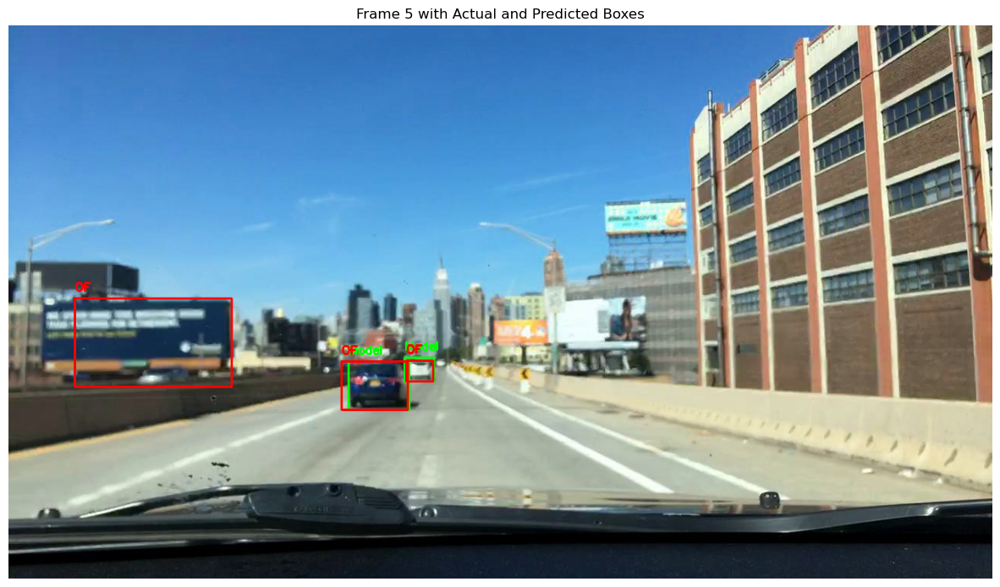

6it [00:02,  2.66it/s]


0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
7
[[488.67596435546875, 466.4508056640625, 75.67041015625, 60.3038330078125], [536.4093017578125, 448.20135498046875, 32.9130859375, 28.790283203125]]
[[487.1241760253906, 468.06390380859375, 94.01166, 61.13446], [535.0708618164062, 448.0918884277344, 39.57202, 29.976501]]
0.7824649242620278


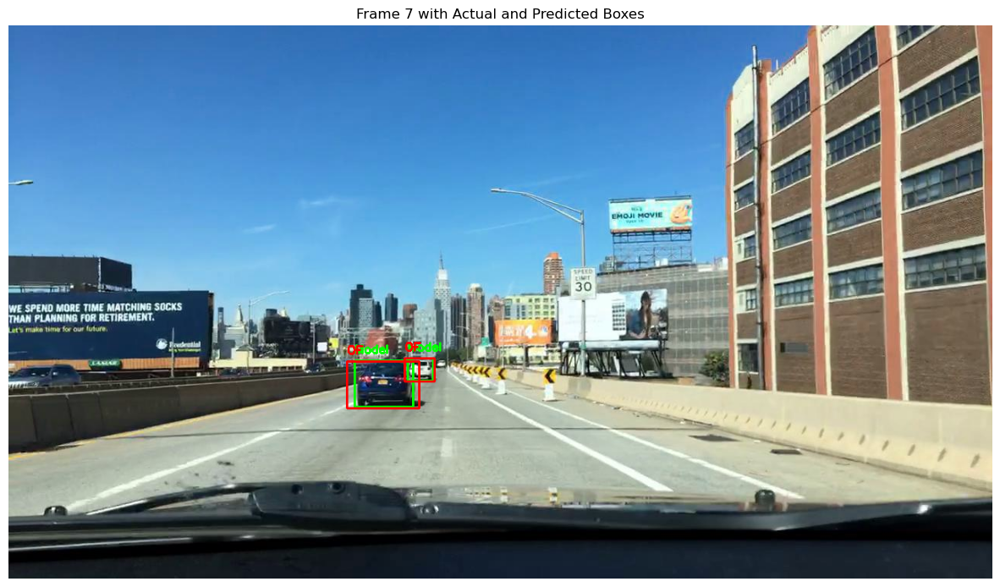

8it [00:02,  3.16it/s]


0: 384x640 1 class_2, 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
10
[[507.083251953125, 464.9491271972656, 79.4879150390625, 58.79730224609375]]
[[491.58946228027344, 466.9269104003906, 100.2742, 64.58423], [538.710693359375, 446.19456481933594, 39.69336, 28.3497]]
0.6454762943745055


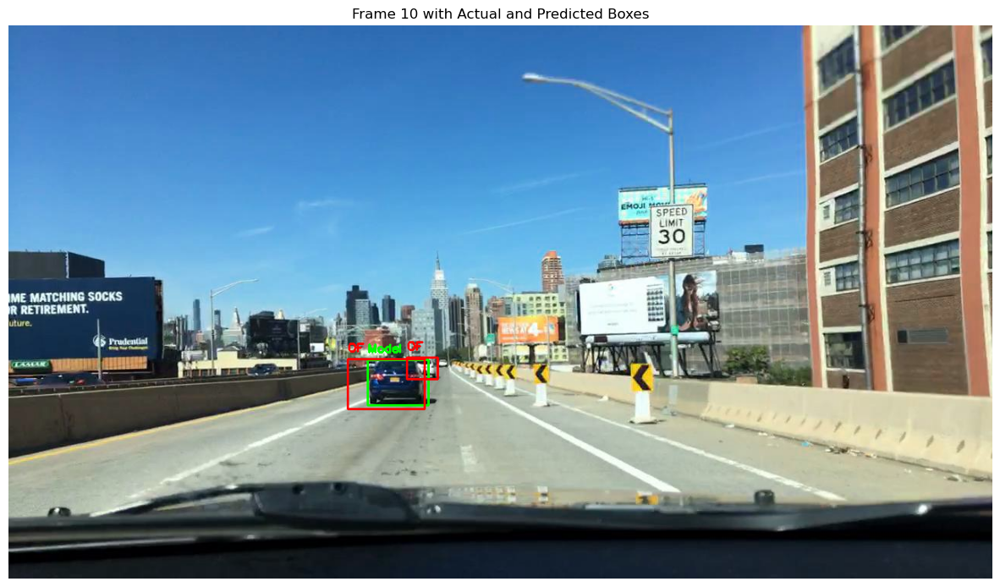

11it [00:03,  4.06it/s]


0: 384x640 3 class_2s, 9.3ms
Speed: 1.4ms preprocess, 9.3ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)
11
[[506.38665771484375, 470.2979736328125, 80.685791015625, 60.4996337890625], [287.20892333984375, 456.12799072265625, 52.478759765625, 24.6754150390625], [542.3839721679688, 451.1578369140625, 27.42626953125, 28.1591796875]]
[[503.53248596191406, 471.0213317871094, 87.39755, 58.212463]]
0.8908892259520331


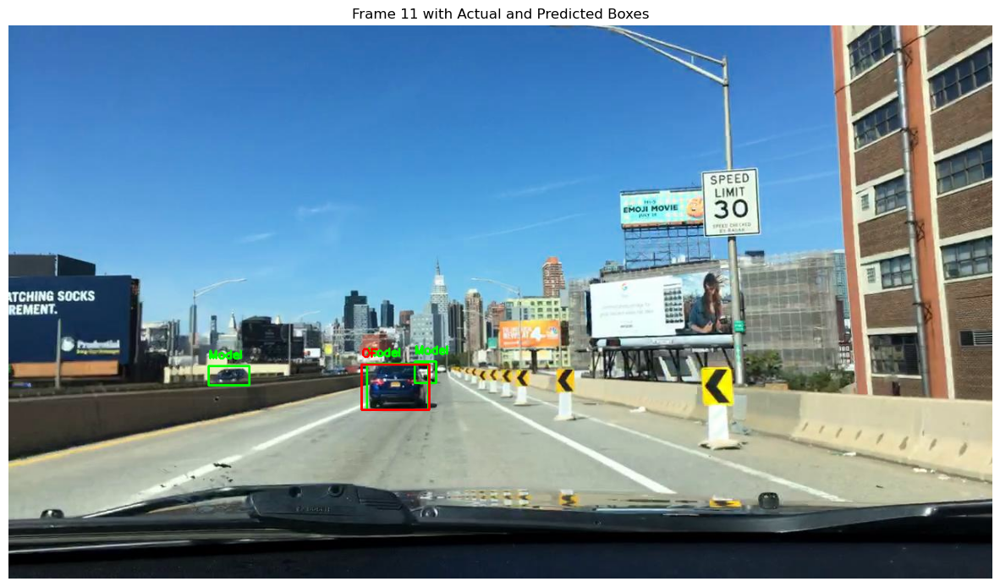

12it [00:03,  3.41it/s]


0: 384x640 2 class_2s, 20.3ms
Speed: 1.4ms preprocess, 20.3ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
13
[[510.6020812988281, 470.27569580078125, 77.81072998046875, 61.1688232421875], [166.85707092285156, 462.54327392578125, 87.40792846679688, 33.872802734375]]
[[505.7280578613281, 469.78985595703125, 97.70697, 61.43219], [274.0443572998047, 458.53895568847656, 63.684845, 41.600983], [541.5884704589844, 450.7288818359375, 30.591736, 28.493652]]
0.39238010634728754


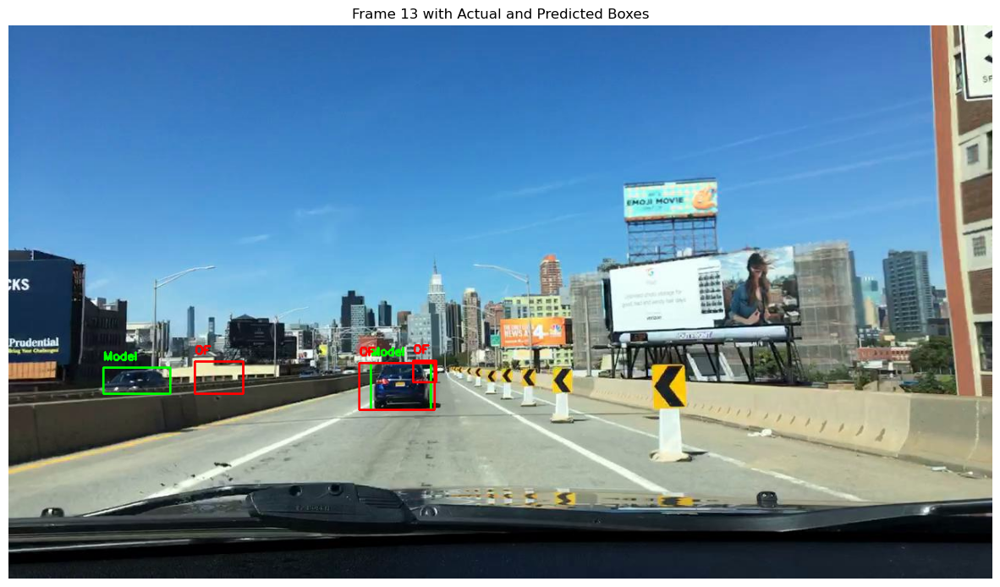

14it [00:04,  3.58it/s]


0: 384x640 3 class_2s, 9.2ms
Speed: 2.9ms preprocess, 9.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)
14
[[508.8945617675781, 467.5391845703125, 75.36163330078125, 56.6131591796875], [56.67725372314453, 464.1629943847656, 113.35450744628906, 45.64166259765625], [1199.52197265625, 463.4424743652344, 60.89208984375, 30.162841796875]]
[[506.52867126464844, 467.28282165527344, 80.98123, 60.28354], [164.67337799072266, 461.18931579589844, 64.827194, 36.268707]]
0.4369729568395364


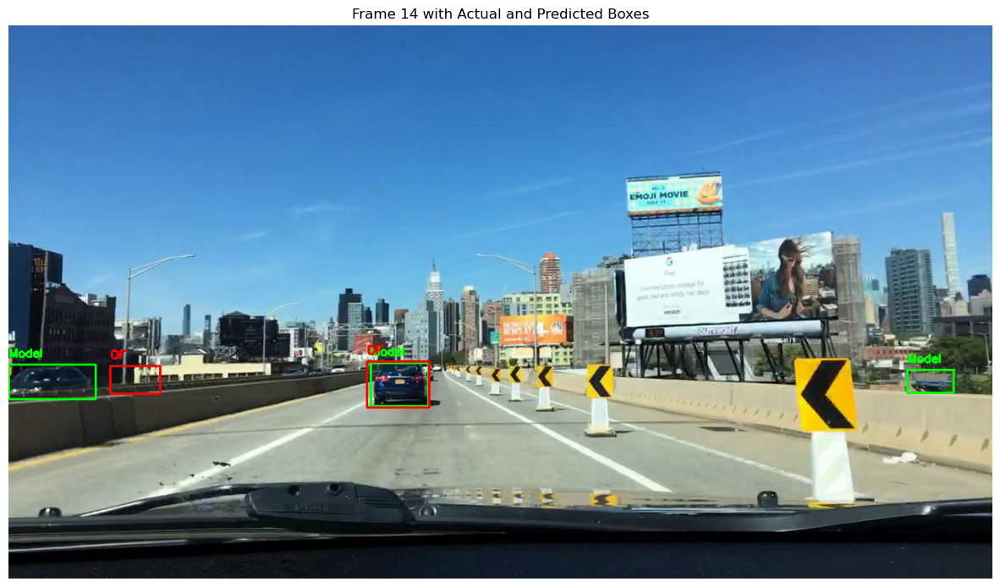

15it [00:04,  2.97it/s]


0: 384x640 1 class_2, 9.0ms
Speed: 1.4ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
15
[[513.2091674804688, 468.86798095703125, 75.9072265625, 58.0504150390625]]
[[507.67579650878906, 470.52044677734375, 77.513275, 55.63147], [86.38442611694336, 464.34063720703125, 98.59019, 53.98352], [1232.27294921875, 462.48101806640625, 90.33447, 29.486206]]
0.8199896096528605


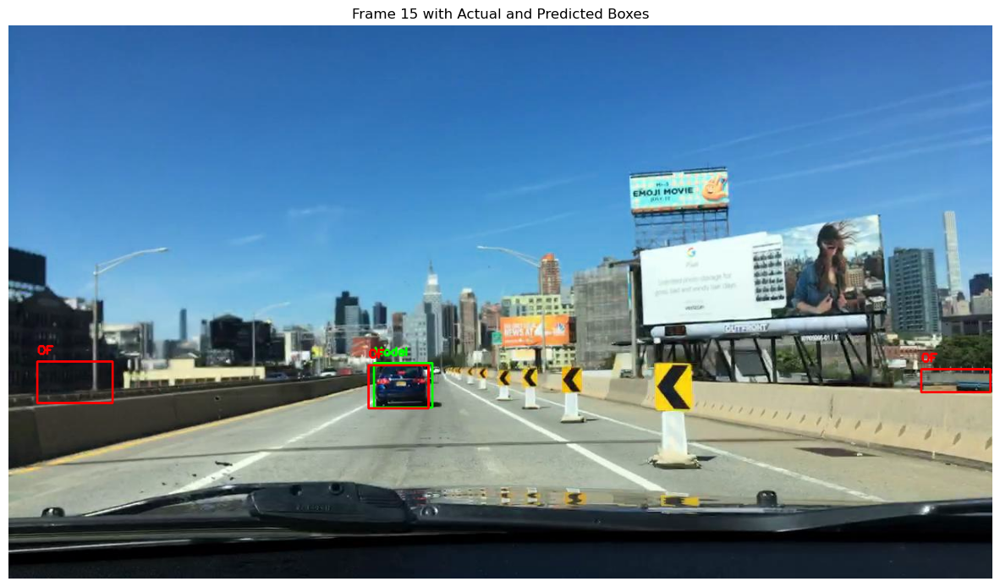

16it [00:05,  2.70it/s]


0: 384x640 2 class_2s, 8.9ms
Speed: 1.5ms preprocess, 8.9ms inference, 10.7ms postprocess per image at shape (1, 3, 384, 640)
17
[[517.30810546875, 467.3382568359375, 73.4013671875, 58.06884765625], [710.8873901367188, 446.46246337890625, 36.30517578125, 17.5758056640625]]
[[513.0476226806641, 467.6044616699219, 79.94052, 57.050476]]
0.8804595019638983


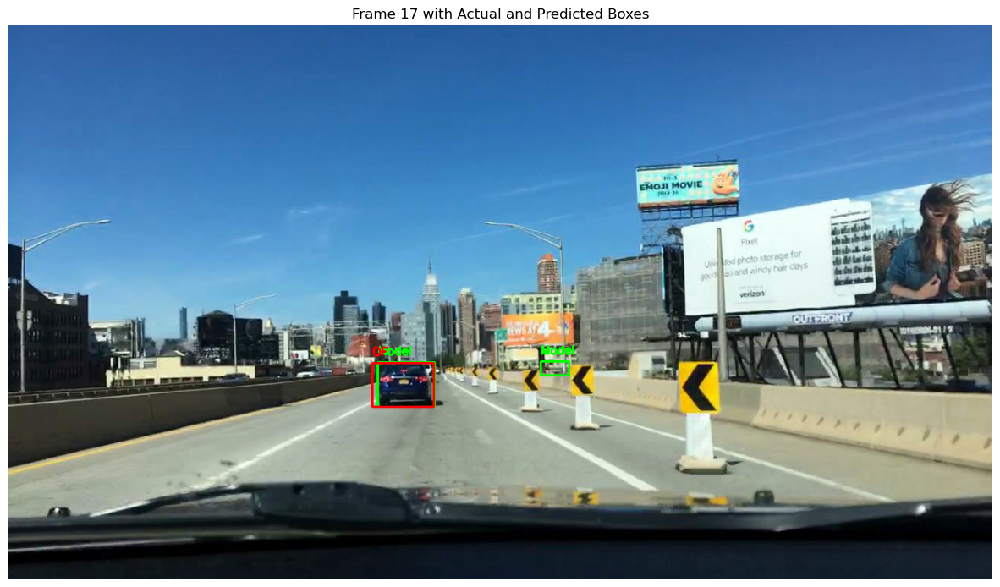

17it [00:05,  3.04it/s]


([[[461.6263427734375, 467.7752380371094, 82.58447265625, 63.50164794921875],
   [525.2235107421875, 451.4540100097656, 31.926025390625, 28.61859130859375]],
  [[468.84112548828125,
    462.63946533203125,
    83.35565185546875,
    62.3582763671875],
   [528.8668212890625, 445.5546875, 36.6376953125, 29.9869384765625],
   [275.2704162597656, 439.2767639160156, 83.134765625, 34.955322265625]],
  [[470.7926025390625, 465.8249816894531, 88.98474, 59.989502],
   [530.9167785644531, 449.3009033203125, 37.166077, 29.110596],
   [235.36976623535156, 443.1480255126953, 144.56265, 36.14676]],
  [[478.6165466308594,
    465.92315673828125,
    85.98870849609375,
    59.5521240234375],
   [534.3681640625, 446.38250732421875, 33.47900390625, 30.46942138671875],
   [130.40609741210938,
    442.95611572265625,
    157.28387451171875,
    47.93701171875],
   [150.11618041992188,
    449.2183837890625,
    113.07164764404297,
    32.7794189453125],
   [106.93717193603516,
    442.51446533203125,
    

In [92]:
model_vs_of(one_vid_dataset, model, __, device, lk_params, 'YOLO', 0.75, True)



In [93]:
import time

In [94]:
# video to be used for validating the Optical-Flow-YOLO  combination
one_video_sample_df = test_df[test_df['videoName'] == '0062f18d-f8cd3a65']
one_vid_dataset = DrivingDataset(image_ids=one_video_sample_df.name.unique(), 
                               dataframe=one_video_sample_df, 
                               transforms=get_valid_transforms())

### Running the combination on the video without plotting to analyze mAP and total time of run

In [95]:
# without plot

start_time = time.time()
final_boxes, model_used = model_vs_of(one_vid_dataset, model, __, device, lk_params, 'YOLO', 0.75, False)
end_time = time.time()

print('Total Time: ', (end_time - start_time))


0it [00:00, ?it/s]


0: 384x640 3 class_0s, 18 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 18 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 17 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


3it [00:00, 29.54it/s]


0: 384x640 2 class_0s, 15 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 16 class_2s, 9.0ms
Speed: 1.4ms preprocess, 9.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


6it [00:00, 29.12it/s]


0: 384x640 1 class_0, 17 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 15 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 15 class_2s, 1 class_4, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


9it [00:00, 28.65it/s]


0: 384x640 14 class_2s, 1 class_4, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 13 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 12 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


12it [00:00, 28.63it/s]


0: 384x640 1 class_0, 10 class_2s, 1 class_4, 1 class_6, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 12 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 14 class_2s, 1 class_4, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


15it [00:00, 28.95it/s]


0: 384x640 2 class_0s, 12 class_2s, 1 class_4, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 11 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 11 class_2s, 2 class_4s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


18it [00:00, 29.03it/s]


0: 384x640 3 class_0s, 13 class_2s, 2 class_4s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 10 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 11 class_2s, 3 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


21it [00:00, 28.98it/s]


0: 384x640 6 class_0s, 10 class_2s, 4 class_4s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 12 class_2s, 1 class_4, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 12 class_2s, 4 class_4s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


24it [00:00, 28.96it/s]


0: 384x640 5 class_0s, 12 class_2s, 1 class_4, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 8 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 9 class_2s, 4 class_4s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


27it [00:00, 29.05it/s]


0: 384x640 4 class_0s, 8 class_2s, 2 class_4s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 7 class_2s, 2 class_4s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 5 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


30it [00:01, 29.29it/s]


0: 384x640 4 class_0s, 6 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 3 class_2s, 2 class_4s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 3 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


33it [00:01, 29.11it/s]


0: 384x640 6 class_0s, 1 class_2, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 2 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 1 class_2, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 1 class_2, 1 class_6, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


37it [00:01, 29.64it/s]


0: 384x640 4 class_0s, 2 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


41it [00:01, 29.90it/s]


0: 384x640 1 class_2, 1 class_6, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 6.9ms
Speed: 1.3ms preprocess, 6.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


45it [00:01, 31.32it/s]


0: 384x640 2 class_2s, 1 class_4, 1 class_6, 6.9ms
Speed: 1.3ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 1 class_6, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


49it [00:01, 32.20it/s]


0: 384x640 2 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_4s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_4s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_4s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


53it [00:01, 31.69it/s]


0: 384x640 1 class_0, 3 class_2s, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_4s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 3 class_4s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


57it [00:01, 32.30it/s]


0: 384x640 3 class_0s, 1 class_2, 2 class_4s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 2 class_4s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 1 class_2, 2 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


61it [00:02, 31.79it/s]


0: 384x640 4 class_0s, 4 class_2s, 1 class_4, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 5 class_2s, 2 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 2 class_2s, 1 class_4, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 3 class_2s, 2 class_4s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


65it [00:02, 31.30it/s]


0: 384x640 2 class_0s, 4 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 4 class_2s, 1 class_4, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 3 class_2s, 1 class_4, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


69it [00:02, 31.14it/s]


0: 384x640 4 class_0s, 5 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 5 class_2s, 1 class_6, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 4 class_2s, 1 class_6, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


73it [00:02, 30.78it/s]


0: 384x640 8 class_0s, 6 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 6 class_2s, 7.4ms
Speed: 1.5ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 7 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


77it [00:02, 30.38it/s]


0: 384x640 8 class_0s, 7 class_2s, 1 class_4, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 6 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 4 class_2s, 2 class_6s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 8 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


81it [00:02, 30.23it/s]


0: 384x640 6 class_0s, 7 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 6 class_2s, 1 class_6, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 7 class_2s, 1 class_6, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_0s, 5 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


85it [00:02, 30.06it/s]


0: 384x640 9 class_0s, 8 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_0s, 10 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_0s, 5 class_2s, 1 class_6, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 8 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


89it [00:02, 29.92it/s]


0: 384x640 9 class_0s, 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_0s, 9 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


92it [00:03, 29.91it/s]


0: 384x640 7 class_0s, 9 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 5 class_2s, 2 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 6 class_2s, 7.4ms
Speed: 1.5ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


95it [00:03, 29.84it/s]


0: 384x640 8 class_0s, 6 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 7 class_2s, 1 class_4, 8.3ms
Speed: 1.2ms preprocess, 8.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 6 class_2s, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


98it [00:03, 29.88it/s]


0: 384x640 8 class_0s, 6 class_2s, 1 class_4, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 4 class_2s, 2 class_4s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 3 class_2s, 2 class_4s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


101it [00:03, 30.16it/s]

Total Time:  3.3504929542541504


## YOLO without Optical Flow

In [96]:
# always running YOLO without optical flow on entire video:

one_video_sample_df = test_df[test_df['videoName'] == '0062f18d-f8cd3a65']
one_vid_dataset = DrivingDataset(image_ids=one_video_sample_df.name.unique(), 
                               dataframe=one_video_sample_df, 
                               transforms=get_valid_transforms())


#initialize bounding boxes:
bboxes = []

start_time = time.time()
for i, (img, target, img_id) in tqdm(enumerate(one_vid_dataset)):

    image_np = img.numpy().transpose(1, 2, 0)  # Convert from PyTorch tensor to NumPy array and change from CxHxW to HxWxC
    image_np = (image_np * 255).astype(np.uint8)  # Convert from [0, 1] to [0, 255]
    image_bgr = cv.cvtColor(image_np, cv.COLOR_RGB2BGR)
    
    # bbox = get_YOLO_pred(img, '__', '__', model, '__', device)
    bbox = model.predict(image_np)[0].boxes.xywh.tolist()
    bboxes.append(bbox)

end_time = time.time()

print("Total Time: ", end_time - start_time)

0it [00:00, ?it/s]


0: 384x640 3 class_0s, 18 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 18 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 17 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 15 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


4it [00:00, 34.20it/s]


0: 384x640 13 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 16 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 17 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 15 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


8it [00:00, 34.79it/s]


0: 384x640 1 class_0, 15 class_2s, 1 class_4, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 13 class_2s, 1 class_6, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 12 class_2s, 9.0ms
Speed: 1.3ms preprocess, 9.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


12it [00:00, 34.38it/s]


0: 384x640 1 class_0, 10 class_2s, 1 class_4, 1 class_6, 7.7ms
Speed: 1.1ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 12 class_2s, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 14 class_2s, 1 class_4, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 12 class_2s, 1 class_4, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


16it [00:00, 34.43it/s]


0: 384x640 2 class_0s, 11 class_2s, 1 class_6, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 11 class_2s, 2 class_4s, 7.3ms
Speed: 1.4ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 13 class_2s, 2 class_4s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 10 class_2s, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


20it [00:00, 34.40it/s]


0: 384x640 5 class_0s, 11 class_2s, 3 class_4s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 10 class_2s, 4 class_4s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 12 class_2s, 1 class_4, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 12 class_2s, 4 class_4s, 8.2ms
Speed: 1.3ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


24it [00:00, 34.18it/s]


0: 384x640 5 class_0s, 12 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 8 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 9 class_2s, 4 class_4s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 8 class_2s, 2 class_4s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


28it [00:00, 34.29it/s]


0: 384x640 6 class_0s, 7 class_2s, 2 class_4s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 5 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 6 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 3 class_2s, 2 class_4s, 7.2ms
Speed: 1.1ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


32it [00:00, 34.48it/s]


0: 384x640 6 class_0s, 3 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 1 class_2, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 2 class_2s, 1 class_4, 1 class_6, 7.5ms
Speed: 1.1ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 1 class_2, 1 class_6, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


36it [00:01, 34.81it/s]


0: 384x640 6 class_0s, 1 class_2, 1 class_6, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 2 class_2s, 1 class_6, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 1 class_6, 8.2ms
Speed: 1.2ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 1 class_6, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


40it [00:01, 34.75it/s]


0: 384x640 1 class_0, 1 class_2, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_6, 7.9ms
Speed: 1.1ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 1 class_6, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


44it [00:01, 34.81it/s]


0: 384x640 3 class_2s, 1 class_6, 7.4ms
Speed: 1.1ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 1 class_6, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


48it [00:01, 34.99it/s]


0: 384x640 1 class_2, 4 class_4s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 1 class_6, 7.6ms
Speed: 1.1ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_4s, 7.4ms
Speed: 1.1ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_4s, 8.4ms
Speed: 1.5ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


52it [00:01, 34.94it/s]


0: 384x640 3 class_2s, 2 class_4s, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 1 class_4, 8.1ms
Speed: 1.4ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_4s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 3 class_4s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


56it [00:01, 34.78it/s]


0: 384x640 1 class_0, 3 class_2s, 1 class_4, 1 class_6, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 1 class_2, 2 class_4s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 1 class_4, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 2 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


60it [00:01, 34.61it/s]


0: 384x640 4 class_0s, 1 class_2, 2 class_4s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 4 class_2s, 1 class_4, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 5 class_2s, 2 class_4s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 2 class_2s, 1 class_4, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


64it [00:01, 34.69it/s]


0: 384x640 2 class_0s, 3 class_2s, 2 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 4 class_2s, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 3 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


68it [00:01, 34.99it/s]


0: 384x640 3 class_0s, 4 class_2s, 1 class_6, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 5 class_2s, 1 class_6, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 5 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 7.7ms
Speed: 1.1ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


72it [00:02, 35.10it/s]


0: 384x640 3 class_0s, 4 class_2s, 1 class_6, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 6 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 5 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 6 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


76it [00:02, 34.99it/s]


0: 384x640 8 class_0s, 7 class_2s, 7.4ms
Speed: 1.1ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 7 class_2s, 1 class_4, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 6 class_2s, 1 class_6, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 4 class_2s, 2 class_6s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


80it [00:02, 35.04it/s]


0: 384x640 9 class_0s, 8 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 7 class_2s, 1 class_6, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 6 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 7 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


84it [00:02, 34.85it/s]


0: 384x640 10 class_0s, 5 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 8 class_2s, 1 class_6, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_0s, 10 class_2s, 1 class_6, 7.7ms
Speed: 1.1ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_0s, 5 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


88it [00:02, 34.85it/s]


0: 384x640 9 class_0s, 8 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 8 class_2s, 7.4ms
Speed: 1.1ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_0s, 9 class_2s, 1 class_4, 7.2ms
Speed: 1.1ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 10 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


92it [00:02, 34.86it/s]


0: 384x640 7 class_0s, 9 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 5 class_2s, 2 class_4s, 7.2ms
Speed: 1.1ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 6 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


96it [00:02, 35.09it/s]


0: 384x640 6 class_0s, 7 class_2s, 1 class_4, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 6 class_2s, 1 class_4, 7.5ms
Speed: 1.1ms preprocess, 7.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 6 class_2s, 1 class_4, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 4 class_2s, 2 class_4s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


100it [00:02, 35.00it/s]


0: 384x640 4 class_0s, 3 class_2s, 2 class_4s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


101it [00:02, 34.77it/s]

Total Time:  2.9062905311584473


### Functions to be used below:


In [97]:

from datetime import datetime
import time
import random

import pickle

#Glob
from glob import glob

In [98]:

def get_valid_transforms():
    return A.Compose([A.Resize(height=512, width=512, p=0),
                      ToTensorV2(p=1.0)],
                      p=1.0,
                      bbox_params=A.BboxParams(format='coco',min_area=0, min_visibility=0,label_fields=['labels'])
                      )
def normalize_boxes(boxes, img_width, img_height):
    normalized_boxes = []
    for box in boxes:
        x_min, y_min, w, h = box
        cx = x_min + (w/2)
        cy = y_min + (h/2)
        cx_normalized = cx / img_width
        cy_normalized = cy / img_height
        w_normalized = w / img_width
        h_normalized = h / img_height
        normalized_boxes.append((cx_normalized, cy_normalized, w_normalized, h_normalized))
    return normalized_boxes


DIR_TRAIN = 'frames_v2'


#OPTIC FLOW METHODS
def get_points_from_boxes(boxes):
    points = []
    box_id = 0
    for box in boxes:
        cx, cy, w, h = box
        x_min = cx - w / 2
        y_min = cy - h / 2
        x_max = cx + w / 2
        y_max = cy + h / 2

        center = (cx, cy)
        top_left = (x_min, y_min)
        top_right = (x_max, y_min)
        bottom_left = (x_min, y_max)
        bottom_right = (x_max, y_max)

        # Append points along with their box ID
        points.extend([(center, box_id), (top_left, box_id), (top_right, box_id), (bottom_left, box_id), (bottom_right, box_id)])
        box_id += 1

    return points


def reconstruct_boxes(tracked_points):
    boxes = []
    # Group points by box ID
    box_points = {}
    for point, box_id in tracked_points:
        if box_id not in box_points:
            box_points[box_id] = []
        box_points[box_id].append(point)
    
    # Reconstruct boxes from grouped points
    for points in box_points.values():
        # Assuming points contains all 5 points (center, 4 corners) for each box
        xs = [p[0] for p in points]
        ys = [p[1] for p in points]
        x = min(xs)
        y = min(ys)
        w = max(xs) - x
        h = max(ys) - y
        boxes.append([x+(w/2), y+(h/2), w, h])
#         boxes.append([x, y, w, h])

    return boxes

def convert_normalized_boxes(boxes, img_width, img_height):
    converted_boxes = []
    for box in boxes:
        x_center, y_center, width, height = box
        x_center_pixel = x_center * img_width
        y_center_pixel = y_center * img_height
        width_pixel = width * img_width
        height_pixel = height * img_height
        converted_boxes.append([x_center_pixel, y_center_pixel, width_pixel, height_pixel])
    return converted_boxes

def normalize_boxes(boxes, img_width, img_height):
    normalized_boxes = []
    for box in boxes:
        cx, cy, w, h = box
        cx_normalized = cx / img_width
        cy_normalized = cy / img_height
        w_normalized = w / img_width
        h_normalized = h / img_height
        normalized_boxes.append([cx_normalized, cy_normalized, w_normalized, h_normalized])
    return normalized_boxes


def draw_boxes(img, boxes, color, label):
    for box in boxes:
        cx, cy, w, h = box  # center_x, center_y, width, height
        x_min = int((cx - w / 2) * img.shape[1])
        y_min = int((cy - h / 2) * img.shape[0])
        x_max = int((cx + w / 2) * img.shape[1])
        y_max = int((cy + h / 2) * img.shape[0])
        cv.rectangle(img, (x_min, y_min), (x_max, y_max), color, 2)
        cv.putText(img, label, (x_min, y_min - 10), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return img

def plot_boxes(img, of_box, model_box, frame_idx):
    img_width, img_height = 1280, 720
    
    model_box_norm = normalize_boxes(model_box, img_width, img_height)
    img_with_boxes = draw_boxes(img.copy(), model_box_norm, (0, 255, 0), "Model")

    of_box_norm = normalize_boxes(of_box, img_width, img_height)
    img_with_boxes = draw_boxes(img_with_boxes, of_box_norm, (0, 0, 255), "OF")

    # Visualize
    plt.figure(figsize=(15, 15))
    plt.imshow(cv.cvtColor(img_with_boxes, cv.COLOR_BGR2RGB))
    plt.title(f"Frame {frame_idx} with Actual and Predicted Boxes")
    plt.axis("off")
    plt.show()

def box_iou(box1, box2):
    # Calculate the (x, y)-coordinates of the intersection rectangle
    xA = max(box1[0] - box1[2] / 2, box2[0] - box2[2] / 2)
    yA = max(box1[1] - box1[3] / 2, box2[1] - box2[3] / 2)
    xB = min(box1[0] + box1[2] / 2, box2[0] + box2[2] / 2)
    yB = min(box1[1] + box1[3] / 2, box2[1] + box2[3] / 2)

    # Compute the area of intersection
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both bounding boxes
    box1Area = box1[2] * box1[3]
    box2Area = box2[2] * box2[3]

    # Compute the intersection over union
    iou = interArea / float(box1Area + box2Area - interArea)
    return iou

def compare_outputs(optic_flow_boxes, model_boxes):
    # Assuming both sets of boxes are in the format [center_x, center_y, width, height]
    # and that they are aligned (each box in one list corresponds to the box at the same index in the other list)
    ious = [box_iou(of_box, model_box) for of_box, model_box in zip(optic_flow_boxes, model_boxes)]
    avg_iou = sum(ious) / len(ious) if ious else 0
    return avg_iou

def calculate_iou_matrix(boxes1, boxes2):
    iou_matrix = np.zeros((len(boxes1), len(boxes2)))
    for i, box1 in enumerate(boxes1):
        for j, box2 in enumerate(boxes2):
            iou_matrix[i, j] = box_iou(box1, box2)
    return iou_matrix

def compute_precision_recall(iou_matrix, num_pred, num_actual, iou_threshold=0.5):
#     iou_matrix = calculate_iou_matrix(predicted_boxes, ground_truth_boxes)
    true_positives = (iou_matrix.max(axis = 1) >= iou_threshold).sum()
    precision = true_positives / num_pred
    recall = min(true_positives, num_actual) / num_actual
    return precision, recall

def compute_average_precision(predicted_boxes, ground_truth_boxes):
    iou_matrix = calculate_iou_matrix(predicted_boxes, ground_truth_boxes)
    thresholds = np.linspace(0, 1, 11)
    precisions = []
    recalls = []
    ts = []
    
    num_pred = len(predicted_boxes)
    num_actual = len(ground_truth_boxes)
    
    for i, t in enumerate(thresholds):
        precision, recall = compute_precision_recall(iou_matrix, num_pred, num_actual, t)
        if (precision in precisions) or (recall in recalls):
            continue
        precisions.append(precision)
        recalls.append(recall)
        ts.append(t)
#         print(t, recall, precision)
     
    r = np.array(recalls)
    p = np.array(precisions)
    sort_idx = np.argsort(r)
    r_sorted = r[sort_idx]
    p_sorted = p[sort_idx]
    
    # Compute the area under the precision-recall curve
    ap = np.trapz(r_sorted, p_sorted)
    return ap

##############

def compute_video_ap(dataset, final_boxes):
    aps = []
    for idx, (img, tgt, img_id) in enumerate(dataset):
        tgt_boxes = tgt['boxes']
        pred_boxes = final_boxes[idx]
        ap = compute_average_precision(pred_boxes, tgt_boxes)
        aps.append(ap)

    return np.mean(aps)

def compute_map(prediction, target):
    target_boxes = target['boxes'].numpy()
    target_boxes_denorm = [np.array(box).astype(np.int32) for box in A.core.bbox_utils.denormalize_bboxes(target_boxes,h,w)]
    target_labels = target['labels'].numpy()
    
    pred_boxes = np.array(prediction['boxes'])
    pred_labels = np.array(prediction['labels'])
    
    aps = []
    
    #class consolidation
    classes = [[0, 2, 3, 5], [1], [4], [6]]
    
    for i in classes:
        class_target_idx = np.isin(target_labels, i)
        class_targets = target_boxes[class_target_idx]
        
        class_pred_idx = np.isin(pred_labels, i)
        class_preds = pred_boxes[class_pred_idx]
        
        if len(class_targets) == 0:
#             aps.append(-1)
            continue
        
        if len(class_preds) == 0:
            aps.append(0)
            continue
        
        ap = compute_average_precision(class_preds, class_targets)
        aps.append(ap)
        
    return np.mean(aps)


###############




In [147]:
video = '0062f18d-f8cd3a65'

## Compute MAP Metrics for YOLO - Optical FLow COMBINED

* final_boxes - results from YOLO-OpticFlow COMBO

* bboxes - reults form YOLO alone

### MAP for 1 Video - YOLO + Optical FLow

In [99]:
# MAP for YOLO + Optical FLow
compute_video_ap(one_vid_dataset, final_boxes) * 100

36.61975351541062

### MAP for ALL Videos - YOLO + Optical FLow

In [149]:
video

'0062f18d-f8cd3a65'

In [150]:
# one_video_sample_df = test_df[test_df['videoName'] == video]
# one_vid_dataset = DrivingDataset(image_ids=one_video_sample_df.name.unique(), 
#                             dataframe=one_video_sample_df, 
#                             transforms=get_valid_transforms())
# final_boxes, _ = model_vs_of(one_vid_dataset, model, __, device, lk_params, show_results = False)

In [101]:

ap = []
for video in tqdm(X_test_list):
    one_video_sample_df = test_df[test_df['videoName'] == video]
    one_vid_dataset = DrivingDataset(image_ids=one_video_sample_df.name.unique(), 
                               dataframe=one_video_sample_df, 
                               transforms=get_valid_transforms())
    final_boxes, _ = model_vs_of(one_vid_dataset, model, __, device, lk_params, show_results = False)
    ap.append(compute_video_ap(one_vid_dataset, final_boxes))

print(np.mean(ap) * 100)

  0%|          | 0/20 [00:00<?, ?it/s]


0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 8.2ms
Speed: 1.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.0ms
Speed: 1.5ms preprocess, 7.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.1ms
Speed: 1.3ms preprocess, 9.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 6 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 2 class_2s, 8.6ms
Speed: 1.2ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_4, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_4, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 9 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 6 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_4, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_4, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_6, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 15 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_4, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 16 class_2s, 2 class_4s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 1 class_4, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 1 class_4, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 13 class_2s, 1 class_4, 9.0ms
Speed: 1.3ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 8.5ms
Speed: 1.3ms preprocess, 8.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 6.9ms
Speed: 1.3ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 9 class_2s, 1 class_4, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 6 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 6 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 6 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.0ms
Speed: 1.4ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_4, 8.8ms
Speed: 1.3ms preprocess, 8.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 7.3ms
Speed: 1.4ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.0ms
Speed: 1.4ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


201it [00:06, 33.43it/s]
  5%|▌         | 1/20 [00:10<03:15, 10.28s/it]


0: 384x640 5 class_2s, 6.8ms
Speed: 1.1ms preprocess, 6.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.0ms
Speed: 1.4ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 8.2ms
Speed: 1.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 9.4ms
Speed: 1.8ms preprocess, 9.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 6.9ms
Speed: 1.3ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 9.4ms
Speed: 1.4ms preprocess, 9.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.2ms
Speed: 1.2ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 17 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 1 class_4, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 1 class_4, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 8.7ms
Speed: 1.2ms preprocess, 8.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 15 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.6ms
Speed: 1.5ms preprocess, 7.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


201it [00:06, 32.20it/s]
 10%|█         | 2/20 [00:20<03:02, 10.12s/it]


0: 384x640 3 class_0s, 18 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 18 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 17 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 15 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 13 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 16 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 17 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 15 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 15 class_2s, 1 class_4, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 13 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 12 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 10 class_2s, 1 class_4, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 12 class_2s, 8.0ms
Speed: 1.6ms preprocess, 8.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 14 class_2s, 1 class_4, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 12 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 11 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 11 class_2s, 2 class_4s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 13 class_2s, 2 class_4s, 8.3ms
Speed: 1.4ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 10 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 11 class_2s, 3 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 10 class_2s, 4 class_4s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 12 class_2s, 1 class_4, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 12 class_2s, 4 class_4s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 12 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 8 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 9 class_2s, 4 class_4s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 8 class_2s, 2 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_0s, 7 class_2s, 2 class_4s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 5 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 6 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 3 class_2s, 2 class_4s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_0s, 3 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 1 class_2, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 2 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 1 class_2, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_0s, 1 class_2, 1 class_6, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 2 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 1 class_6, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 1 class_6, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_4, 1 class_6, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_4s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_4s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 2 class_4s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_4s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 3 class_4s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 1 class_2, 2 class_4s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 1 class_4, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 2 class_4s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 1 class_2, 2 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 4 class_2s, 1 class_4, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 5 class_2s, 2 class_4s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 2 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 3 class_2s, 2 class_4s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 4 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 3 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 4 class_2s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 5 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 5 class_2s, 1 class_6, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 4 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 5 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 6 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_0s, 7 class_2s, 7.3ms
Speed: 1.4ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 7 class_2s, 1 class_4, 8.0ms
Speed: 1.5ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 6 class_2s, 1 class_6, 7.4ms
Speed: 1.5ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 4 class_2s, 2 class_6s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_0s, 8 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 7 class_2s, 1 class_6, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 6 class_2s, 1 class_6, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 7 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_0s, 5 class_2s, 1 class_6, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 8 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_0s, 10 class_2s, 1 class_6, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_0s, 5 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_0s, 8 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 8 class_2s, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_0s, 9 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 10 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_0s, 9 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 5 class_2s, 2 class_4s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 6 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 6 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_0s, 7 class_2s, 1 class_4, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 6 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 6 class_2s, 1 class_4, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 4 class_2s, 2 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 3 class_2s, 2 class_4s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


101it [00:03, 31.49it/s]
 15%|█▌        | 3/20 [00:27<02:30,  8.83s/it]


0: 384x640 3 class_0s, 12 class_2s, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 5 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 7 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_0s, 11 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 15 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 17 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 17 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 16 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 17 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 16 class_2s, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 18 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 16 class_2s, 1 class_4, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 17 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_0s, 18 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 18 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_0s, 18 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 17 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 17 class_2s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 17 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 17 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 17 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 15 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 15 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_0s, 16 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 15 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 16 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 15 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 12 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_0s, 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 11 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 17 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 17 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 17 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 17 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 18 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 18 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_0s, 18 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 18 class_2s, 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 17 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 17 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 18 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 17 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 17 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 17 class_2s, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 18 class_2s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 19 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 17 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 16 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 16 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 14 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 16 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 14 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 15 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 14 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 18 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 17 class_2s, 9.1ms
Speed: 1.4ms preprocess, 9.1ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 15 class_2s, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 16 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 18 class_2s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 14 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 17 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 17 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 19 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 24 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 25 class_2s, 8.1ms
Speed: 1.6ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 21 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 25 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 22 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 24 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 25 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 14 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 16 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 18 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 21 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 16 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 16 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 16 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 16 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 class_2s, 1 class_4, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 1 class_4, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_4, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 9 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 10 class_2s, 1 class_4, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 3 class_4s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_4, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 2 class_4s, 1 class_6, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_4, 1 class_6, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 1 class_4, 1 class_6, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_4, 1 class_6, 8.6ms
Speed: 1.4ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 3 class_4s, 2 class_6s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 2 class_4s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 2 class_4s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 8 class_2s, 2 class_4s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_4, 1 class_6, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7 class_2s, 1 class_4, 1 class_6, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 13 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 16 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 11 class_2s, 1 class_6, 8.4ms
Speed: 1.3ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 9 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 11 class_2s, 1 class_6, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 12 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 9 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 11 class_2s, 1 class_6, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 10 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 7 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 7 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 8 class_2s, 1 class_6, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 8 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 11 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 9 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 9 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 9 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 8 class_2s, 1 class_6, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 8 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 8 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 8 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_6, 9.2ms
Speed: 1.4ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_6, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 10 class_2s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 8 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 8 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 10 class_2s, 1 class_6, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 9 class_2s, 1 class_6, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 10 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 10 class_2s, 2 class_4s, 1 class_6, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 9 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 10 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7 class_2s, 1 class_6, 7.7ms
Speed: 1.5ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 7 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 7 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 7 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 6 class_2s, 1 class_6, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 6 class_2s, 1 class_6, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 5 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 5 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 6 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 6 class_2s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


202it [00:06, 29.93it/s]
 20%|██        | 4/20 [00:44<03:09, 11.83s/it]


0: 384x640 3 class_2s, 1 class_4, 3 class_6s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 2 class_6s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 3 class_4s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_4, 2 class_6s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.6ms
Speed: 1.4ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_6, 7.3ms
Speed: 1.4ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 9.5ms
Speed: 1.3ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_6s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_6s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_6s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 1 class_6, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 9.3ms
Speed: 1.3ms preprocess, 9.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 9.4ms
Speed: 1.5ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 1 class_6, 9.5ms
Speed: 1.3ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.1ms
Speed: 1.7ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 8.6ms
Speed: 1.3ms preprocess, 8.6ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 2 class_6s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_6s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_6s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_6s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_4, 8.8ms
Speed: 1.4ms preprocess, 8.8ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 1 class_4, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_4, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 8.4ms
Speed: 1.2ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_4, 8.9ms
Speed: 1.2ms preprocess, 8.9ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_4, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_4s, 8.7ms
Speed: 1.4ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_4, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 8.5ms
Speed: 1.3ms preprocess, 8.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_4, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_6, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 2 class_6s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_6, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 2 class_6s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 2 class_6s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 2 class_6s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 2 class_6s, 9.0ms
Speed: 1.3ms preprocess, 9.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 2 class_6s, 8.0ms
Speed: 1.5ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 1 class_6, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 1 class_6, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 2 class_6s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 1 class_6, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


200it [00:05, 33.70it/s]
 25%|██▌       | 5/20 [00:53<02:43, 10.90s/it]


0: 384x640 21 class_2s, 6.8ms
Speed: 1.1ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 18 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 14 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 17 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 16 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 1 class_6, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 13 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 9.6ms
Speed: 1.3ms preprocess, 9.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 10 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 11 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 8.6ms
Speed: 1.4ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 8.7ms
Speed: 1.3ms preprocess, 8.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 10.5ms
Speed: 1.5ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 8.1ms
Speed: 1.5ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 8.4ms
Speed: 1.4ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 8.4ms
Speed: 1.3ms preprocess, 8.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 11 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 15 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.4ms
Speed: 1.1ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 13 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 14 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 class_2s, 9.4ms
Speed: 1.4ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 1 class_4, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 9.5ms
Speed: 1.2ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 1 class_4, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 12 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 7 class_2s, 1 class_4, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 9 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 9.4ms
Speed: 1.3ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 12 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 8 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 6 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 6 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 13 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 13 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 8.9ms
Speed: 1.5ms preprocess, 8.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 16 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_1, 12 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_1, 12 class_2s, 1 class_3, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_1, 9 class_2s, 1 class_3, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 1 class_3, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_1, 9 class_2s, 2 class_3s, 9.7ms
Speed: 1.4ms preprocess, 9.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 3 class_3s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 14 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 8.7ms
Speed: 1.3ms preprocess, 8.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 13 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 8.0ms
Speed: 1.4ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 6.7ms
Speed: 1.2ms preprocess, 6.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 1 class_3, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 1 class_3, 8.3ms
Speed: 1.4ms preprocess, 8.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 2 class_3s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


201it [00:06, 30.26it/s]
 30%|███       | 6/20 [01:07<02:46, 11.93s/it]


0: 384x640 4 class_2s, 7.4ms
Speed: 1.7ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.5ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 8.0ms
Speed: 1.4ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.3ms
Speed: 1.4ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.7ms
Speed: 1.5ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.0ms
Speed: 1.6ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 9.3ms
Speed: 1.2ms preprocess, 9.3ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_6, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.7ms
Speed: 1.3ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.4ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.9ms
Speed: 1.5ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


202it [00:05, 37.17it/s]
 35%|███▌      | 7/20 [01:16<02:22, 10.93s/it]


0: 384x640 (no detections), 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
tensor([[0.0002, 0.0011, 0.0140, 0.0931],
        [0.0005, 0.0011, 0.0156, 0.0552],
        [0.0005, 0.0011, 0.0142, 0.0624],
        [0.0005, 0.0011, 0.0115, 0.0480],
        [0.0002, 0.0011, 0.0140, 0.0925],
        [0.0006, 0.0011, 0.0312, 0.0429]])

0: 384x640 (no detections), 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 8.2ms
Speed: 1.4ms preprocess, 8.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 9.1ms
Speed: 1.5ms preprocess, 9.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.6ms
Speed: 1.3ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 9.5ms
Speed: 1.3ms preprocess, 9.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.8ms
Speed: 1.4ms preprocess, 8.8ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.5ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 8.3ms
Speed: 1.3ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 9.3ms
Speed: 1.4ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.1ms
Speed: 1.5ms preprocess, 8.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.8ms
Speed: 1.5ms preprocess, 8.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 9.8ms
Speed: 1.4ms preprocess, 9.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.1ms
Speed: 1.5ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.8ms
Speed: 1.2ms preprocess, 8.8ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.0ms
Speed: 1.5ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.3ms
Speed: 1.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 9.3ms
Speed: 1.5ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 6.9ms
Speed: 1.1ms preprocess, 6.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


201it [00:06, 33.15it/s]
 40%|████      | 8/20 [01:24<02:01, 10.13s/it]


0: 384x640 5 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 2 class_6s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 3 class_6s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 1 class_6, 8.7ms
Speed: 1.3ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 5 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.5ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 5 class_2s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 5 class_2s, 1 class_6, 9.0ms
Speed: 1.2ms preprocess, 9.0ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 5 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 8.9ms
Speed: 1.4ms preprocess, 8.9ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 5 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 6 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 5 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 1 class_1, 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 4 class_2s, 1 class_3, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 5 class_2s, 1 class_3, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 5 class_2s, 1 class_3, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 4 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 10.4ms
Speed: 1.5ms preprocess, 10.4ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 9.3ms
Speed: 1.3ms preprocess, 9.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 9.8ms
Speed: 1.4ms preprocess, 9.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 6.9ms
Speed: 1.3ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.2ms
Speed: 1.5ms preprocess, 9.2ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 8.1ms
Speed: 1.4ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 9.4ms
Speed: 1.5ms preprocess, 9.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 3 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 3 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 2 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 3 class_2s, 1 class_6, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 1 class_6, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 3 class_2s, 1 class_6, 9.2ms
Speed: 1.5ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 3 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 1 class_2, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 1 class_2, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_0s, 3 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 2 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_0s, 2 class_2s, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 2 class_2s, 1 class_3, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 4 class_2s, 9.9ms
Speed: 1.5ms preprocess, 9.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 6 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 3 class_2s, 2 class_6s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_3, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_3, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 2 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 4 class_2s, 7.2ms
Speed: 1.6ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 2 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 4 class_2s, 8.3ms
Speed: 1.5ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 3 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 1 class_2, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 1 class_6, 8.1ms
Speed: 1.5ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 3 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 3 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


201it [00:06, 31.71it/s]
 45%|████▌     | 9/20 [01:34<01:52, 10.24s/it]


0: 384x640 1 class_2, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.8ms
Speed: 1.7ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.5ms
Speed: 1.3ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 9.6ms
Speed: 1.3ms preprocess, 9.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 8.0ms
Speed: 1.1ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_6, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 1 class_6, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.8ms
Speed: 1.4ms preprocess, 8.8ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.8ms
Speed: 1.4ms preprocess, 8.8ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.9ms
Speed: 1.4ms preprocess, 8.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.8ms
Speed: 1.3ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.4ms
Speed: 1.2ms preprocess, 8.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.5ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.3ms
Speed: 1.4ms preprocess, 8.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 8.0ms
Speed: 1.4ms preprocess, 8.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 9.3ms
Speed: 1.2ms preprocess, 9.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 9.0ms
Speed: 1.5ms preprocess, 9.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


198it [00:05, 34.86it/s]
 50%|█████     | 10/20 [01:42<01:34,  9.49s/it]


0: 384x640 2 class_2s, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 6.9ms
Speed: 1.3ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 9.1ms
Speed: 1.5ms preprocess, 9.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.7ms
Speed: 1.5ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 8.6ms
Speed: 1.5ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.0ms
Speed: 1.4ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 9.3ms
Speed: 1.4ms preprocess, 9.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 10.2ms
Speed: 1.5ms preprocess, 10.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.6ms
Speed: 1.5ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 2 class_4s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 2 class_4s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 8.7ms
Speed: 1.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_0s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 9.4ms
Speed: 1.4ms preprocess, 9.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_0s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_0s, 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 10.5ms
Speed: 1.5ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 6.9ms
Speed: 1.1ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 8.2ms
Speed: 1.3ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 9.0ms
Speed: 1.4ms preprocess, 9.0ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 1 class_2, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 2 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 2 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 8.0ms
Speed: 1.5ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.9ms
Speed: 1.2ms preprocess, 8.9ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.4ms
Speed: 1.3ms preprocess, 9.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 8.4ms
Speed: 1.5ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 9.0ms
Speed: 1.4ms preprocess, 9.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.2ms
Speed: 1.5ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.4ms
Speed: 1.1ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_4, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 8.7ms
Speed: 1.2ms preprocess, 8.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 6 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


193it [00:05, 33.43it/s]
 55%|█████▌    | 11/20 [01:51<01:22,  9.11s/it]


0: 384x640 7 class_2s, 7.0ms
Speed: 1.1ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 1 class_4, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.7ms
Speed: 1.1ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 8.5ms
Speed: 1.5ms preprocess, 8.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 8.8ms
Speed: 1.5ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 8.4ms
Speed: 1.4ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 2 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.1ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 1 class_2, 10.1ms
Speed: 1.5ms preprocess, 10.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_4, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_4, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_6s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 9.1ms
Speed: 1.5ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 2 class_6s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 3 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 4 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_3, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 1 class_3, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_1, 3 class_2s, 1 class_3, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 1 class_1, 2 class_2s, 1 class_3, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_1, 2 class_2s, 2 class_3s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 3 class_3s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


201it [00:05, 36.64it/s]
 60%|██████    | 12/20 [01:59<01:11,  8.94s/it]


0: 384x640 5 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 9.7ms
Speed: 1.4ms preprocess, 9.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 8.8ms
Speed: 1.3ms preprocess, 8.8ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.8ms
Speed: 1.5ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 10.6ms
Speed: 1.4ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.6ms
Speed: 1.3ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 10.0ms
Speed: 1.5ms preprocess, 10.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_4, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.1ms
Speed: 1.5ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.0ms
Speed: 1.5ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 9.0ms
Speed: 1.5ms preprocess, 9.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 8.2ms
Speed: 1.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.3ms
Speed: 1.3ms preprocess, 9.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 9.1ms
Speed: 1.5ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.7ms
Speed: 1.5ms preprocess, 9.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 8.2ms
Speed: 1.4ms preprocess, 8.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 10.2ms
Speed: 1.5ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 10.4ms
Speed: 1.5ms preprocess, 10.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 9.0ms
Speed: 1.3ms preprocess, 9.0ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 9.0ms
Speed: 1.4ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 9.3ms
Speed: 1.3ms preprocess, 9.3ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.7ms
Speed: 1.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 8.9ms
Speed: 1.5ms preprocess, 8.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


202it [00:05, 34.68it/s]
 65%|██████▌   | 13/20 [02:08<01:01,  8.84s/it]


0: 384x640 6 class_2s, 9.2ms
Speed: 1.9ms preprocess, 9.2ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 10.3ms
Speed: 1.5ms preprocess, 10.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 9.9ms
Speed: 1.5ms preprocess, 9.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 11.4ms
Speed: 1.5ms preprocess, 11.4ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 11.3ms
Speed: 1.5ms preprocess, 11.3ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 12.5ms
Speed: 1.8ms preprocess, 12.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 12.5ms
Speed: 1.5ms preprocess, 12.5ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 10.4ms
Speed: 1.8ms preprocess, 10.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.5ms
Speed: 1.2ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 8.2ms
Speed: 1.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 8.2ms
Speed: 1.3ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.7ms
Speed: 1.1ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 9.8ms
Speed: 1.5ms preprocess, 9.8ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.3ms
Speed: 1.4ms preprocess, 9.3ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 9.3ms
Speed: 1.3ms preprocess, 9.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 8 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_6, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 10.2ms
Speed: 1.6ms preprocess, 10.2ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 3 class_6s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.0ms
Speed: 1.4ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 3 class_6s, 8.5ms
Speed: 1.4ms preprocess, 8.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 3 class_6s, 7.2ms
Speed: 1.5ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 3 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 8.1ms
Speed: 1.4ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 9.9ms
Speed: 1.4ms preprocess, 9.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 2 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 2 class_6s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_6s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 2 class_6s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_6s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 10.1ms
Speed: 1.5ms preprocess, 10.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 8.2ms
Speed: 1.3ms preprocess, 8.2ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.1ms
Speed: 1.5ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 10.0ms
Speed: 1.5ms preprocess, 10.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.3ms
Speed: 1.4ms preprocess, 9.3ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.4ms
Speed: 1.3ms preprocess, 8.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 8.4ms
Speed: 1.4ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 5 class_2s, 9.0ms
Speed: 1.5ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_6s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 8.7ms
Speed: 1.2ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_6, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 14 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 1 class_6, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_4, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 1 class_4, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_4, 1 class_6, 9.3ms
Speed: 1.4ms preprocess, 9.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


201it [00:06, 30.70it/s]
 70%|███████   | 14/20 [02:19<00:56,  9.47s/it]


0: 384x640 8 class_2s, 6.9ms
Speed: 1.1ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 9.6ms
Speed: 1.3ms preprocess, 9.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 9.7ms
Speed: 1.5ms preprocess, 9.7ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 10.3ms
Speed: 1.5ms preprocess, 10.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 class_2s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 10.2ms
Speed: 1.5ms preprocess, 10.2ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 14 class_2s, 7.2ms
Speed: 1.5ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 15 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 11 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.1ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 9.7ms
Speed: 1.2ms preprocess, 9.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_4, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_4, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_4, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.5ms
Speed: 1.3ms preprocess, 9.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.4ms
Speed: 1.4ms preprocess, 9.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 8.6ms
Speed: 1.3ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 9.3ms
Speed: 1.5ms preprocess, 9.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 9.7ms
Speed: 1.5ms preprocess, 9.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.6ms
Speed: 1.3ms preprocess, 9.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_6, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 1 class_6, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 9.7ms
Speed: 1.5ms preprocess, 9.7ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 7.7ms
Speed: 1.5ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 1 class_6, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 1 class_6, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


199it [00:06, 31.99it/s]
 75%|███████▌  | 15/20 [02:29<00:48,  9.78s/it]


0: 384x640 7 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 8.2ms
Speed: 1.2ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.8ms
Speed: 1.4ms preprocess, 9.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 6.7ms
Speed: 1.2ms preprocess, 6.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 8.4ms
Speed: 1.3ms preprocess, 8.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 10.5ms
Speed: 1.7ms preprocess, 10.5ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.7ms
Speed: 1.5ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.4ms
Speed: 1.5ms preprocess, 9.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


101it [00:02, 33.75it/s]
 80%|████████  | 16/20 [02:34<00:32,  8.20s/it]


0: 384x640 1 class_2, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 10.2ms
Speed: 1.5ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 8.8ms
Speed: 1.4ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 8.3ms
Speed: 1.3ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 8.6ms
Speed: 1.2ms preprocess, 8.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.3ms
Speed: 1.2ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.8ms
Speed: 1.5ms preprocess, 9.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.8ms
Speed: 1.5ms preprocess, 9.8ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 9.7ms
Speed: 1.4ms preprocess, 9.7ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.3ms
Speed: 1.4ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.8ms
Speed: 1.3ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 9.7ms
Speed: 1.5ms preprocess, 9.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.9ms
Speed: 1.3ms preprocess, 8.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.5ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 10.1ms
Speed: 1.5ms preprocess, 10.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.3ms
Speed: 1.2ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.8ms
Speed: 1.4ms preprocess, 9.8ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.4ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.2ms
Speed: 1.2ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.4ms
Speed: 1.5ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 9.6ms
Speed: 1.3ms preprocess, 9.6ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.2ms
Speed: 1.2ms preprocess, 8.2ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 (no detections), 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 11.7ms
Speed: 1.6ms preprocess, 11.7ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 6.8ms
Speed: 1.3ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 8.7ms
Speed: 1.5ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.8ms
Speed: 1.5ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.8ms
Speed: 1.4ms preprocess, 9.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 9.0ms
Speed: 1.3ms preprocess, 9.0ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 10.0ms
Speed: 1.5ms preprocess, 10.0ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


199it [00:06, 32.52it/s]
 85%|████████▌ | 17/20 [02:43<00:25,  8.43s/it]


0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 class_2s, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 14 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 9.0ms
Speed: 1.3ms preprocess, 9.0ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.7ms
Speed: 1.1ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 8.3ms
Speed: 1.4ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 8.4ms
Speed: 1.4ms preprocess, 8.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 10.0ms
Speed: 1.5ms preprocess, 10.0ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 6 class_2s, 8.3ms
Speed: 1.2ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 6 class_2s, 9.4ms
Speed: 1.5ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_0s, 8 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 6 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_0s, 6 class_2s, 9.0ms
Speed: 1.5ms preprocess, 9.0ms inference, 6.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_0s, 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_0s, 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 5 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_0s, 11 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_0, 10 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_0, 11 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 9.4ms
Speed: 1.6ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 8.8ms
Speed: 1.3ms preprocess, 8.8ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 13 class_2s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 9.7ms
Speed: 1.4ms preprocess, 9.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 12 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_6, 8.4ms
Speed: 1.5ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 10 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_6, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 1 class_6, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 1 class_6, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 8.3ms
Speed: 1.2ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 9.7ms
Speed: 1.4ms preprocess, 9.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 9.2ms
Speed: 1.4ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 9.4ms
Speed: 1.4ms preprocess, 9.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 8.6ms
Speed: 1.5ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


201it [00:06, 32.88it/s]
 90%|█████████ | 18/20 [02:54<00:18,  9.23s/it]


0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 17.5ms
Speed: 1.4ms preprocess, 17.5ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 9.7ms
Speed: 1.4ms preprocess, 9.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_6, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.3ms
Speed: 1.5ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.6ms
Speed: 1.4ms preprocess, 9.6ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 8.2ms
Speed: 1.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_4, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 2 class_4s, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 9.4ms
Speed: 1.4ms preprocess, 9.4ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 9.2ms
Speed: 1.5ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 2 class_4s, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_4s, 1 class_6, 7.1ms
Speed: 1.4ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 1 class_6, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.3ms
Speed: 1.1ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_4s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 1 class_4, 2 class_6s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 2 class_4s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_4, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_4s, 2 class_6s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 1 class_6, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_4, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 9.0ms
Speed: 1.7ms preprocess, 9.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_4s, 2 class_6s, 9.0ms
Speed: 1.2ms preprocess, 9.0ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_4, 2 class_6s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 8.2ms
Speed: 1.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 2 class_6s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_6s, 9.9ms
Speed: 1.3ms preprocess, 9.9ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_6s, 9.7ms
Speed: 1.4ms preprocess, 9.7ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 2 class_6s, 9.5ms
Speed: 1.3ms preprocess, 9.5ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 2 class_6s, 9.0ms
Speed: 1.5ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_6s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_6s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 2 class_6s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_6s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 2 class_6s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 3 class_6s, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_6s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 2 class_6s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 1 class_4, 2 class_6s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 3 class_6s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 2 class_6s, 7.3ms
Speed: 1.4ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_4, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_4, 9.7ms
Speed: 1.6ms preprocess, 9.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 2 class_6s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 2 class_6s, 7.8ms
Speed: 1.3ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 2 class_6s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 2 class_6s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 2 class_6s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_4, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_6s, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 2 class_6s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 2 class_6s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.4ms
Speed: 1.3ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 3 class_6s, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 2 class_6s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 2 class_6s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_6s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 3 class_6s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 2 class_6s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 2 class_6s, 7.4ms
Speed: 1.1ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 2 class_6s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 1 class_6, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 7.3ms
Speed: 1.4ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_6, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_6s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 2 class_6s, 9.1ms
Speed: 1.5ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 2 class_6s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 3 class_6s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 2 class_6s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_6, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 3 class_6s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 2 class_6s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_6, 9.9ms
Speed: 1.5ms preprocess, 9.9ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 1 class_4, 3 class_6s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 1 class_4, 2 class_6s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 2 class_6s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_4, 2 class_6s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 2 class_6s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 1 class_4, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


201it [00:06, 33.45it/s]
 95%|█████████▌| 19/20 [03:04<00:09,  9.46s/it]


0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 9.5ms
Speed: 1.6ms preprocess, 9.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 8.1ms
Speed: 1.4ms preprocess, 8.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.8ms
Speed: 1.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.5ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.0ms
Speed: 1.4ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 6.9ms
Speed: 1.2ms preprocess, 6.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.4ms
Speed: 1.5ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 8.4ms
Speed: 1.2ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.8ms
Speed: 1.1ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 class_2, 9.3ms
Speed: 1.5ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 10.0ms
Speed: 1.4ms preprocess, 10.0ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 9.9ms
Speed: 1.6ms preprocess, 9.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 8.3ms
Speed: 1.4ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 2 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 6.8ms
Speed: 1.2ms preprocess, 6.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 2 class_6s, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 8.2ms
Speed: 1.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 8.0ms
Speed: 1.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 9 class_2s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 8.2ms
Speed: 1.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 10.3ms
Speed: 1.5ms preprocess, 10.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 8.4ms
Speed: 1.4ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 9.9ms
Speed: 1.8ms preprocess, 9.9ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.7ms
Speed: 1.4ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_4, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 25.8ms
Speed: 2.2ms preprocess, 25.8ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.8ms
Speed: 1.6ms preprocess, 9.8ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.6ms
Speed: 1.2ms preprocess, 7.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 2 class_6s, 8.3ms
Speed: 1.2ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 8 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 8 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.7ms
Speed: 1.5ms preprocess, 9.7ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 9.4ms
Speed: 1.3ms preprocess, 9.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 9.9ms
Speed: 1.5ms preprocess, 9.9ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 8.4ms
Speed: 1.3ms preprocess, 8.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 1 class_6, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 class_2s, 7.1ms
Speed: 1.3ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 7 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 7.0ms
Speed: 1.3ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 1 class_6, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.7ms
Speed: 1.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 9.4ms
Speed: 1.5ms preprocess, 9.4ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 3 class_2s, 1 class_6, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.2ms
Speed: 1.3ms preprocess, 7.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 class_2s, 1 class_6, 7.3ms
Speed: 1.3ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 9.5ms
Speed: 1.5ms preprocess, 9.5ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 4 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 1 class_6, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 2 class_6s, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.0ms
Speed: 1.2ms preprocess, 7.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 2 class_6s, 9.6ms
Speed: 1.5ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)



0: 384x640 5 class_2s, 1 class_6, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 class_2s, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


201it [00:06, 33.05it/s]
100%|██████████| 20/20 [03:15<00:00,  9.75s/it]

28.962862929460588


In [102]:
np.mean(ap) * 100

28.962862929460588

## Compute MAP Metrics for YOLO without Optical FLow

### MAP for 1 Video - YOLO without Optical FLow

In [152]:
# test_set_yolo_OptFlow_MAP = pd.DataFrame(ap)
# test_set_yolo_OptFlow_MAP.to_csv('test_set_yolo_OptFlow_MAP.txt', index=False, header=False)

In [100]:
# MAP for YOLO without Optical FLow
compute_video_ap(one_vid_dataset, bboxes) * 100

36.92540908096717

### MAP for ALL Videos - YOLO without Optical FLow

* this was done already during training

# Plots of YOLO (without Optical Flow) Predictions vs. True Bounding Boxes

In [154]:
# ap = []
# for video in tqdm(X_test_list):
#     one_video_sample_df = test_df[test_df['videoName'] == video]
#     one_vid_dataset = DrivingDataset(image_ids=one_video_sample_df.name.unique(), 
#                                dataframe=one_video_sample_df, 
#                                transforms=get_valid_transforms())
#     bboxes, _ = model_vs_of(one_vid_dataset, model, __, device, lk_params, show_results = False)
#     ap.append(compute_video_ap(one_vid_dataset, bboxes))

# print(np.mean(ap) * 100)

In [53]:
# load trained YOLO model in:
model = YOLO(f'yolo_trained_results/best.pt')

In [56]:
vid1 = X_test_list[3]
vid2 = X_test_list[6]
vid3 = X_test_list[12]

In [63]:
img1 = test_df[(test_df['videoName'] == vid1) & (test_df['frameIndex'] == 20)]['name'].unique()[0]
img2 = test_df[(test_df['videoName'] == vid2) & (test_df['frameIndex'] == 20)]['name'].unique()[0]
img3 = test_df[(test_df['videoName'] == vid3) & (test_df['frameIndex'] == 20)]['name'].unique()[0]

In [65]:
f1 = cv.imread(f'frames_v2/{img1}')
f2 = cv.imread(f'frames_v2/{img2}')
f3 = cv.imread(f'frames_v2/{img3}')

In [66]:
pred1 = model.predict(f1)
pred2 = model.predict(f2)
pred3 = model.predict(f3)


0: 384x640 5 class_0s, 17 class_2s, 13.3ms
Speed: 1.7ms preprocess, 13.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 class_2s, 5.7ms
Speed: 1.2ms preprocess, 5.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 class_2s, 6.1ms
Speed: 1.2ms preprocess, 6.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


In [72]:
pred1[0].boxes.xyxy

tensor([[ 368.7875,  348.1411,  483.9446,  411.7229],
        [ 682.8026,  353.6320,  777.3019,  417.4268],
        [ 251.9067,  340.1339,  362.6115,  408.2422],
        [ 644.6873,  350.4226,  697.4097,  402.3115],
        [ 454.4284,  340.4741,  516.0228,  401.8918],
        [1215.9329,  318.2695, 1252.5471,  428.6480],
        [ 616.7782,  350.5858,  651.7626,  389.7143],
        [ 655.7594,  351.3012,  709.7526,  406.8145],
        [  71.1838,  244.6500,  184.9227,  552.9312],
        [ 637.4417,  350.7514,  680.8015,  397.6935],
        [ 540.5205,  357.7219,  567.6484,  382.0892],
        [1001.5953,  321.6692, 1058.6083,  412.3076],
        [1000.1432,  325.7183, 1038.5304,  409.3055],
        [ 567.6545,  357.0794,  598.3679,  384.9832],
        [ 628.2863,  350.6598,  657.9747,  393.8322],
        [ 597.9225,  352.4714,  624.7080,  388.9647],
        [ 519.4144,  355.4041,  547.3545,  381.0858],
        [ 603.5115,  354.3790,  631.3120,  389.0432],
        [ 588.2450,  356.721

In [69]:
test_df[(test_df['videoName'] == vid1) & (test_df['frameIndex'] == 20)].head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,...,haveVideo,x,y,w,h,class,x_center,y_center,width,height
1308589,007aeb45-3e75ce0e-0000021.jpg,007aeb45-3e75ce0e,20,100276.0,person,False,True,False,96.766917,129.248120,...,True,96.766917,327.518797,32.481203,85.263158,0,0.088287,0.514098,0.025376,0.118421
1308590,007aeb45-3e75ce0e-0000021.jpg,007aeb45-3e75ce0e,20,100259.0,person,False,False,False,71.816359,104.105885,...,True,71.816359,313.987802,32.289526,93.528281,0,0.068720,0.501044,0.025226,0.129900
1308591,007aeb45-3e75ce0e-0000021.jpg,007aeb45-3e75ce0e,20,100280.0,person,False,False,False,80.526316,270.000000,...,True,80.526316,250.375940,189.473684,313.984962,0,0.136924,0.565789,0.148026,0.436090
1308592,007aeb45-3e75ce0e-0000021.jpg,007aeb45-3e75ce0e,20,100260.0,person,False,False,False,1006.240602,1048.195489,...,True,1006.240602,323.458647,41.954887,86.616541,0,0.802514,0.509398,0.032777,0.120301
1308593,007aeb45-3e75ce0e-0000021.jpg,007aeb45-3e75ce0e,20,100261.0,person,False,True,False,1027.894737,1073.909774,...,True,1027.894737,312.631579,46.015038,97.443609,0,0.821017,0.501880,0.035949,0.135338


In [88]:
true_1 = test_df[(test_df['videoName'] == vid1) & (test_df['frameIndex'] == 20)][['box2d.x1', 'box2d.y1', 'box2d.x2', 'box2d.y2']].to_numpy()
true_2 = test_df[(test_df['videoName'] == vid2) & (test_df['frameIndex'] == 20)][['box2d.x1', 'box2d.y1', 'box2d.x2', 'box2d.y2']].to_numpy()
true_3 = test_df[(test_df['videoName'] == vid3) & (test_df['frameIndex'] == 20)][['box2d.x1', 'box2d.y1', 'box2d.x2', 'box2d.y2']].to_numpy()

In [70]:
test_df.columns

Index(['name', 'videoName', 'frameIndex', 'id', 'category', 'attributes.crowd',
       'attributes.occluded', 'attributes.truncated', 'box2d.x1', 'box2d.x2',
       'box2d.y1', 'box2d.y2', 'haveVideo', 'x', 'y', 'w', 'h', 'class',
       'x_center', 'y_center', 'width', 'height'],
      dtype='object')

In [81]:
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    img_bgr = cv.cvtColor(img_, cv.COLOR_RGB2BGR)
    ax.imshow(img_bgr)
    ax.axis("off")
    plt.show()

# color_map = {
#     "car": (0, 0, 255),
#     "truck": (0, 0, 100),
#     "pedestrian": (255, 0, 0),
#     "other vehicle": (0, 0, 150),
#     "rider": (200, 100, 0),
#     "bicycle": (0, 255, 0),
#     "other person": (200, 0, 0),
#     "trailer": (0, 150, 150),
#     "motorcycle": (0, 150, 0),
#     "bus": (0, 0, 100),
# }



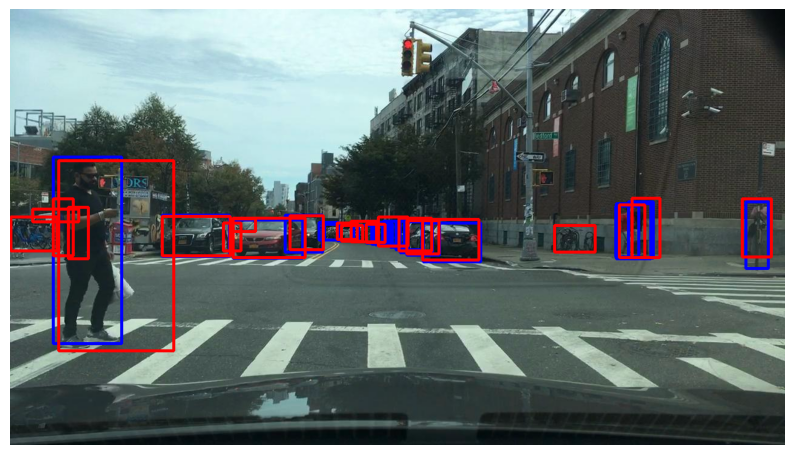

In [93]:
img = cv.imread(f'frames_v2/{img1}')
img = np.array(img)


img_example = img.copy()
# frame_labels = df_cleaned[df_cleaned['name'] == img_example]
for i, d in enumerate(pred1[0].boxes.xyxy):
    pt1 = int(d[0]), int(d[1])
    pt2 = int(d[2]), int(d[3])
    cv.rectangle(img_example, pt1, pt2, (0,0,255), 3)
for i, d in enumerate(true_1):
    pt1 = int(d[0]), int(d[1])
    pt2 = int(d[2]), int(d[3])
    cv.rectangle(img_example, pt1, pt2, (255,0,0), 3)
display_cv2_img(img_example)


In [94]:
# blue - perdicitve 
# red - true


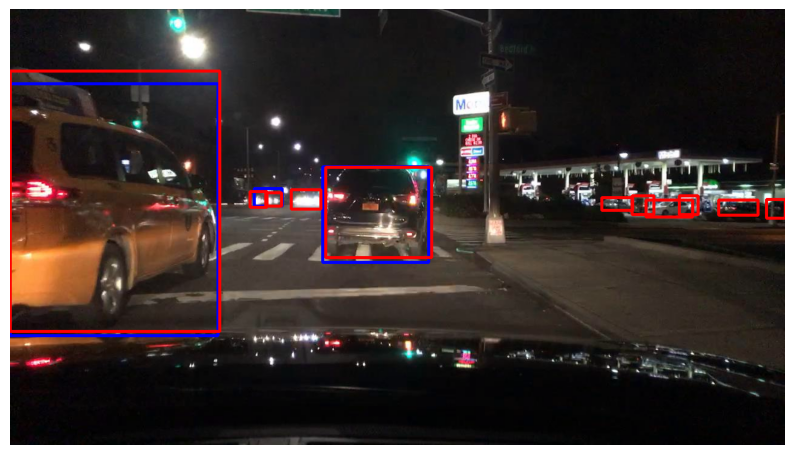

In [95]:
img = cv.imread(f'frames_v2/{img2}')
img = np.array(img)


img_example = img.copy()
# frame_labels = df_cleaned[df_cleaned['name'] == img_example]
for i, d in enumerate(pred2[0].boxes.xyxy):
    pt1 = int(d[0]), int(d[1])
    pt2 = int(d[2]), int(d[3])
    cv.rectangle(img_example, pt1, pt2, (0,0,255), 3)
for i, d in enumerate(true_2):
    pt1 = int(d[0]), int(d[1])
    pt2 = int(d[2]), int(d[3])
    cv.rectangle(img_example, pt1, pt2, (255,0,0), 3)
display_cv2_img(img_example)


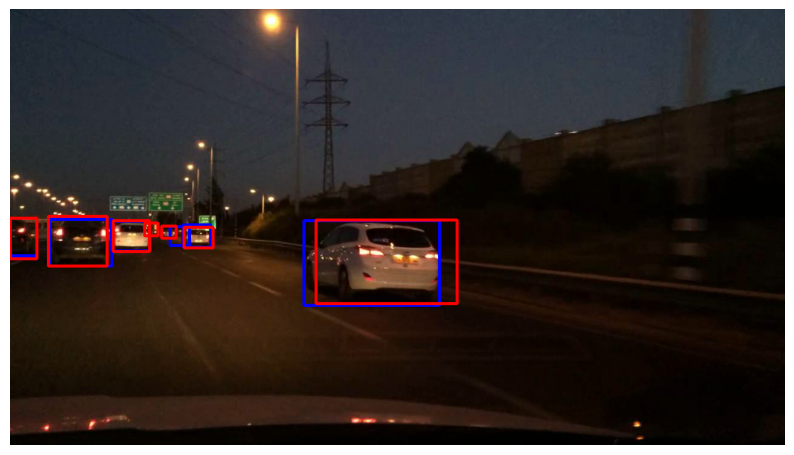

In [96]:
img = cv.imread(f'frames_v2/{img3}')
img = np.array(img)


img_example = img.copy()
# frame_labels = df_cleaned[df_cleaned['name'] == img_example]
for i, d in enumerate(pred3[0].boxes.xyxy):
    pt1 = int(d[0]), int(d[1])
    pt2 = int(d[2]), int(d[3])
    cv.rectangle(img_example, pt1, pt2, (0,0,255), 3)
for i, d in enumerate(true_3):
    pt1 = int(d[0]), int(d[1])
    pt2 = int(d[2]), int(d[3])
    cv.rectangle(img_example, pt1, pt2, (255,0,0), 3)
display_cv2_img(img_example)


# Retrain for more epochs:

In [103]:
model = YOLO(f'{HOME}/yolov8n.pt')

In [104]:
# TRAIN:

'''
integer representations of the class labels of interest in the coco128.yaml file
0: person
1: bicycle
2: car
3: motorcycle
4: bus
5: train
6: truck
'''


# train_results = model.train(data="coco128.yaml", classes=7, epochs=3)
train_results = model.train(data="coco128.yaml", classes=[0,1,2,3,4,5,6], epochs=9)
train_results

New https://pypi.org/project/ultralytics/8.0.228 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.227 🚀 Python-3.11.5 torch-2.1.2 CUDA:0 (NVIDIA A10G, 22564MiB)
engine/trainer: task=detect, mode=train, model=/home/ubuntu/project/ese546finalproject/yolov8n.pt, data=coco128.yaml, epochs=9, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train31, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=[0, 1, 2, 3, 4, 5, 6], retina_masks=False, show=False, save_fra

 21                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 
 22        [15, 18, 21]  1    752677  ultralytics.nn.modules.head.Detect           [7, [64, 128, 256]]           
Model summary: 225 layers, 3012213 parameters, 3012197 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /home/ubuntu/datasets/train_frames_small_yolo.cache... 15518 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15518/15518 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/ubuntu/datasets/test_frames_small_yolo.cache... 3807 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3807/3807 [00:00<?, ?it/s]


Plotting labels to /home/ubuntu/runs/detect/train31/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/ubuntu/runs/detect/train31
Starting training for 9 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/9       3.2G      1.674      1.668      1.235        226        640:  92%|█████████▏| 888/970 [02:24<00:11,  6.85it/s]

# NOTE: This was an atytempt to train the YOLO model on more epochs to result in a better mAP score. However, due to limited time, resource limitations, and connection to GPU crashing, the project was finalized with only the 2 epochs of training done earlier. This was the number of epochs DETR was trained for, making it a more fair assessment/comparison of the two models.